# GeoPandas

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/giswqs/geog-312/blob/main/book/geospatial/geopandas.ipynb)

## Overview

[GeoPandas](https://geopandas.org) is an open-source Python library that simplifies working with geospatial data by extending Pandas data structures. It seamlessly integrates geospatial operations with a pandas-like interface, allowing for the manipulation of geometric types such as points, lines, and polygons. GeoPandas combines the functionalities of Pandas and Shapely, enabling geospatial operations like spatial joins, buffering, intersections, and projections with ease.

## Learning Objectives

By the end of this lecture, you should be able to:

- Understand the basic data structures in GeoPandas: `GeoDataFrame` and `GeoSeries`.
- Create `GeoDataFrames` from tabular data and geometric shapes.
- Read and write geospatial data formats like Shapefile and GeoJSON.
- Perform common geospatial operations such as measuring areas, distances, and spatial relationships.
- Visualize geospatial data using Matplotlib and GeoPandas' built-in plotting functions.
- Work with different Coordinate Reference Systems (CRS) and project geospatial data.

## Concepts

The core data structures in GeoPandas are `GeoDataFrame` and `GeoSeries`. A `GeoDataFrame` extends the functionality of a Pandas DataFrame by adding a geometry column, allowing spatial data operations on geometric shapes. The `GeoSeries` handles geometric data (points, polygons, etc.).

A `GeoDataFrame` can have multiple geometry columns, but only one is considered the active geometry at any time. All spatial operations are applied to this active geometry, accessible via the `.geometry` attribute.

## Installing and Importing GeoPandas

Before we begin, make sure you have geopandas installed. You can install it using:

In [ ]:
# %pip install geopandas

Once installed, import GeoPandas and other necessary libraries:

In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

## Creating GeoDataFrames

A GeoDataFrame is a tabular data structure that contains a `geometry` column, which holds the geometric shapes. You can create a GeoDataFrame from a list of geometries or from a pandas DataFrame.

In [2]:
# Creating a GeoDataFrame from scratch
data = {
    "City": ["Tokyo", "New York", "London", "Paris"],
    "Latitude": [35.6895, 40.7128, 51.5074, 48.8566],
    "Longitude": [139.6917, -74.0060, -0.1278, 2.3522],
}

df = pd.DataFrame(data)
gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.Longitude, df.Latitude))
gdf

,City,Latitude,Longitude,geometry
0,Tokyo,35.6895,139.6917,POINT (139.69170 35.68950)
1,New York,40.7128,-74.0060,POINT (-74.00600 40.71280)
2,London,51.5074,-0.1278,POINT (-0.12780 51.50740)
3,Paris,48.8566,2.3522,POINT (2.35220 48.85660)


## Reading and Writing Geospatial Data

GeoPandas allows reading and writing a variety of geospatial formats, such as Shapefiles, GeoJSON, and more. We'll use a GeoJSON dataset of New York City borough boundaries.

### Reading a GeoJSON File

We'll load the New York boroughs dataset from a GeoJSON file hosted online.

In [3]:
url = "https://github.com/opengeos/datasets/releases/download/vector/nybb.geojson"
gdf = gpd.read_file(url)
gdf.head()

,BoroCode,BoroName,Shape_Leng,Shape_Area,geometry
0,5,Staten Island,330470.010332,1.623820e+09,"MULTIPOLYGON (((970217.022 145643.332, 970227...."
1,4,Queens,896344.047763,3.045213e+09,"MULTIPOLYGON (((1029606.077 156073.814, 102957..."
2,3,Brooklyn,741080.523166,1.937479e+09,"MULTIPOLYGON (((1021176.479 151374.797, 102100..."
3,1,Manhattan,359299.096471,6.364715e+08,"MULTIPOLYGON (((981219.056 188655.316, 980940...."
4,2,Bronx,464392.991824,1.186925e+09,"MULTIPOLYGON (((1012821.806 229228.265, 101278..."


This `GeoDataFrame` contains several columns, including `BoroName`, which represents the names of the boroughs, and `geometry`, which stores the polygons for each borough.

### Writing to a GeoJSON File

GeoPandas also supports saving geospatial data back to disk. For example, we can save the GeoDataFrame as a new GeoJSON file:

In [4]:
output_file = "nyc_boroughs.geojson"
gdf.to_file(output_file, driver="GeoJSON")
print(f"GeoDataFrame has been written to {output_file}")

GeoDataFrame has been written to nyc_boroughs.geojson


Similarly, you can write GeoDataFrames to other formats, such as Shapefiles, GeoPackage, and more.

In [5]:
output_file = "nyc_boroughs.shp"
gdf.to_file(output_file)

In [6]:
output_file = "nyc_boroughs.gpkg"
gdf.to_file(output_file, driver="GPKG")

## Simple Accessors and Methods

Now that we have the data, let's explore some simple GeoPandas methods to manipulate and analyze the geometric data.

### Measuring Area

We can calculate the area of each borough. GeoPandas automatically calculates the area of each polygon:

In [7]:
# Set BoroName as the index for easier reference
gdf = gdf.set_index("BoroName")

# Calculate the area
gdf["area"] = gdf.area
gdf

,BoroCode,Shape_Leng,Shape_Area,geometry,area
BoroName,,,,,
Staten Island,5,330470.010332,1.623820e+09,"MULTIPOLYGON (((970217.022 145643.332, 970227....",1.623822e+09
Queens,4,896344.047763,3.045213e+09,"MULTIPOLYGON (((1029606.077 156073.814, 102957...",3.045214e+09
Brooklyn,3,741080.523166,1.937479e+09,"MULTIPOLYGON (((1021176.479 151374.797, 102100...",1.937478e+09
Manhattan,1,359299.096471,6.364715e+08,"MULTIPOLYGON (((981219.056 188655.316, 980940....",6.364712e+08
Bronx,2,464392.991824,1.186925e+09,"MULTIPOLYGON (((1012821.806 229228.265, 101278...",1.186926e+09


### Getting Polygon Boundaries and Centroids

To get the boundary (lines) and centroid (center point) of each polygon:

In [8]:
# Get the boundary of each polygon
gdf["boundary"] = gdf.boundary

# Get the centroid of each polygon
gdf["centroid"] = gdf.centroid

gdf[["boundary", "centroid"]]

,boundary,centroid
BoroName,,
Staten Island,"MULTILINESTRING ((970217.022 145643.332, 97022...",POINT (941639.450 150931.991)
Queens,"MULTILINESTRING ((1029606.077 156073.814, 1029...",POINT (1034578.078 197116.604)
Brooklyn,"MULTILINESTRING ((1021176.479 151374.797, 1021...",POINT (998769.115 174169.761)
Manhattan,"MULTILINESTRING ((981219.056 188655.316, 98094...",POINT (993336.965 222451.437)
Bronx,"MULTILINESTRING ((1012821.806 229228.265, 1012...",POINT (1021174.790 249937.980)


### Measuring Distance

We can also measure the distance from each borough's centroid to a reference point, such as the centroid of Manhattan.

In [9]:
# Use Manhattan's centroid as the reference point
manhattan_centroid = gdf.loc["Manhattan", "centroid"]

# Calculate the distance from each centroid to Manhattan's centroid
gdf["distance_to_manhattan"] = gdf["centroid"].distance(manhattan_centroid)
gdf[["centroid", "distance_to_manhattan"]]

,centroid,distance_to_manhattan
BoroName,,
Staten Island,POINT (941639.450 150931.991),88247.742789
Queens,POINT (1034578.078 197116.604),48401.272479
Brooklyn,POINT (998769.115 174169.761),48586.299386
Manhattan,POINT (993336.965 222451.437),0.000000
Bronx,POINT (1021174.790 249937.980),39121.024479


### Calculating Mean Distance

We can calculate the mean distance between the borough centroids and Manhattan:

In [10]:
mean_distance = gdf["distance_to_manhattan"].mean()
print(f"Mean distance to Manhattan: {mean_distance} units")

Mean distance to Manhattan: 44871.26782659276 units


## Plotting Geospatial Data

GeoPandas integrates with Matplotlib for easy plotting of geospatial data. Let's create some maps to visualize the data.

### Plotting the Area of Each Borough

We can color the boroughs based on their area and display a legend:

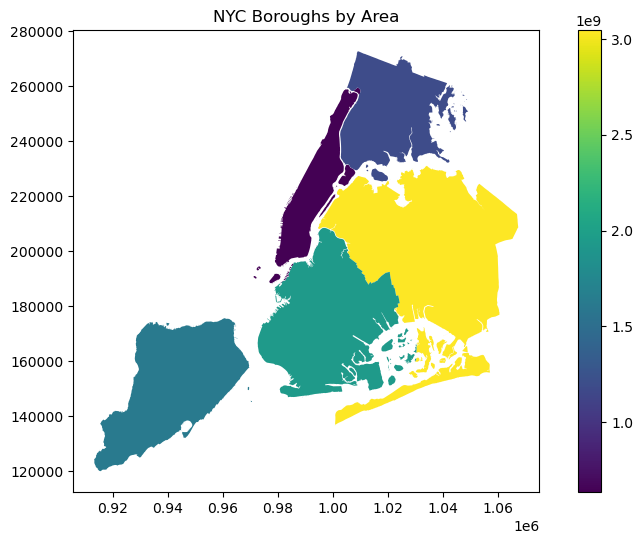

In [11]:
gdf.plot("area", legend=True, figsize=(10, 6))
plt.title("NYC Boroughs by Area")
plt.show()

### Plotting Centroids and Boundaries

We can also plot the centroids and boundaries:

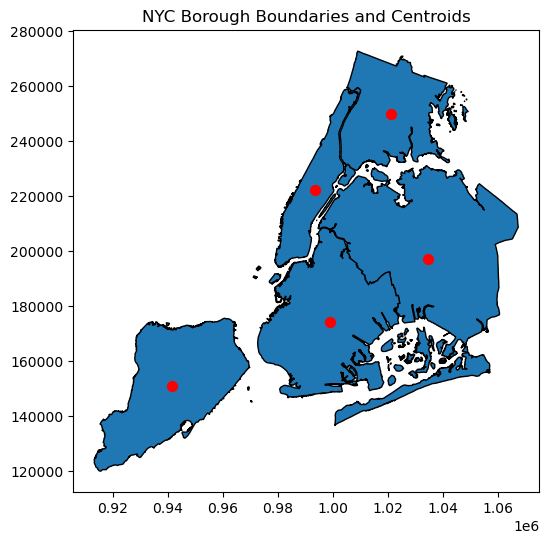

In [12]:
# Plot the boundaries and centroids
ax = gdf["geometry"].plot(figsize=(10, 6), edgecolor="black")
gdf["centroid"].plot(ax=ax, color="red", markersize=50)
plt.title("NYC Borough Boundaries and Centroids")
plt.show()

You can also explore your data interactively using `GeoDataFrame.explore()`, which behaves in the same way `plot()` does but returns an interactive map instead.

In [13]:
gdf.explore("area", legend=False)

## Geometry Manipulations

GeoPandas provides several methods for manipulating geometries, such as buffering (creating a buffer zone around geometries) and computing convex hulls (the smallest convex shape enclosing the geometries).

### Buffering Geometries

We can create a buffer zone around each borough:

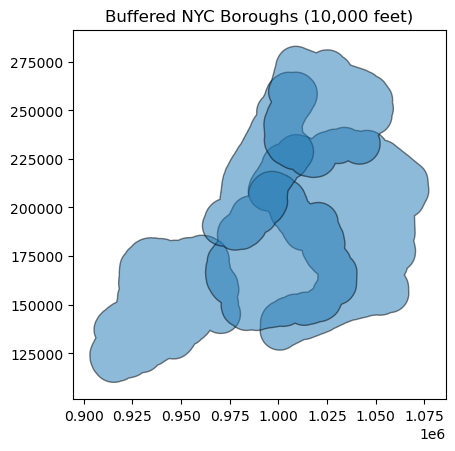

In [14]:
# Buffer the boroughs by 10000 feet
gdf["buffered"] = gdf.buffer(10000)

# Plot the buffered geometries
gdf["buffered"].plot(alpha=0.5, edgecolor="black")
plt.title("Buffered NYC Boroughs (10,000 feet)")
plt.show()

### Convex Hulls

The convex hull is the smallest convex shape that can enclose a geometry. Let's calculate the convex hull for each borough:

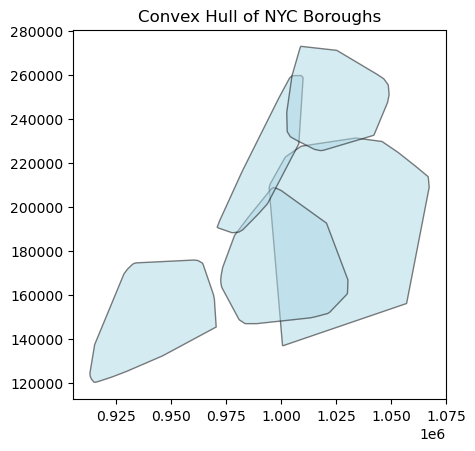

In [15]:
# Calculate convex hull
gdf["convex_hull"] = gdf.convex_hull

# Plot the convex hulls
gdf["convex_hull"].plot(alpha=0.5, color="lightblue", edgecolor="black")
plt.title("Convex Hull of NYC Boroughs")
plt.show()

## Spatial Queries and Relations

We can also perform spatial queries to examine relationships between geometries. For instance, we can check which boroughs are within a certain distance of Manhattan.

### Checking for Intersections

We can find which boroughs' buffered areas intersect with the original geometry of Manhattan:

In [16]:
# Get the geometry of Manhattan
manhattan_geom = gdf.loc["Manhattan", "geometry"]

# Check which buffered boroughs intersect with Manhattan's geometry
gdf["intersects_manhattan"] = gdf["buffered"].intersects(manhattan_geom)
gdf[["intersects_manhattan"]]

,intersects_manhattan
BoroName,
Staten Island,False
Queens,True
Brooklyn,True
Manhattan,True
Bronx,True


### Checking for Containment

Similarly, we can check if the centroids are contained within the borough boundaries:

In [17]:
# Check if centroids are within the original borough geometries
gdf["centroid_within_borough"] = gdf["centroid"].within(gdf["geometry"])
gdf[["centroid_within_borough"]]

,centroid_within_borough
BoroName,
Staten Island,True
Queens,True
Brooklyn,True
Manhattan,True
Bronx,True


## Projections and Coordinate Reference Systems (CRS)

GeoPandas makes it easy to manage projections. Each GeoSeries and GeoDataFrame has a crs attribute that defines its CRS.

### Checking the CRS

Let's check the CRS of the boroughs dataset:

In [18]:
print(gdf.crs)

EPSG:2263


The CRS for this dataset is [`EPSG:2263`](https://epsg.io/2263) (NAD83 / New York State Plane). We can reproject the geometries to WGS84 ([`EPSG:4326`](https://epsg.io/4326)), which uses latitude and longitude coordinates.

[EPSG](https://epsg.io) stands for European Petroleum Survey Group, which was a scientific organization that standardized geodetic and coordinate reference systems. EPSG codes are unique identifiers that represent coordinate systems and other geodetic properties. 

### Reprojecting to WGS84

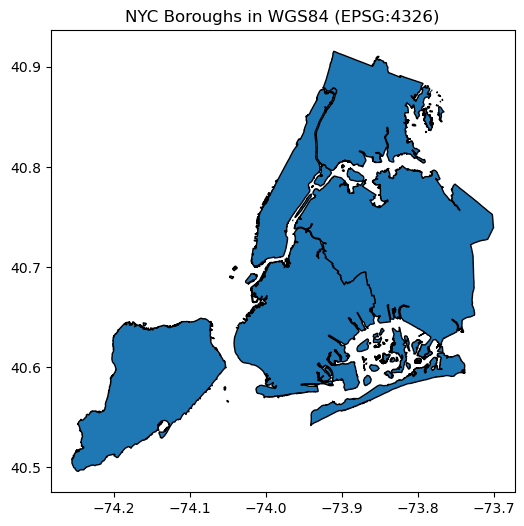

In [19]:
# Reproject the GeoDataFrame to WGS84 (EPSG:4326)
gdf_4326 = gdf.to_crs(epsg=4326)

# Plot the reprojected geometries
gdf_4326.plot(figsize=(10, 6), edgecolor="black")
plt.title("NYC Boroughs in WGS84 (EPSG:4326)")
plt.show()

Notice how the coordinates have changed from feet to degrees.

## Exercises

1. Create a GeoDataFrame containing a list of countries and their capital cities. Add a geometry column with the locations of the capitals.
2. Load a shapefile of your choice, filter the data to only include a specific region or country, and save the filtered GeoDataFrame to a new file.
3. Perform a spatial join between two GeoDataFrames: one containing polygons (e.g., country borders) and one containing points (e.g., cities). Find out which points fall within which polygons.
4. Plot a map showing the distribution of a particular attribute (e.g., population) across different regions.

## **Section 1:**
## Read country geometry data
##### At the end of each section we save a checkpoint file. Can skip to Section 3, just run import package cell

In [1]:
# Import a few packages
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
import os
pd.options.display.max_rows = 300

In [2]:
# Get country boundaries from Arc online API
countries_url = "https://services.arcgis.com/P3ePLMYs2RVChkJx/arcgis/rest/services/World_Countries_(Generalized)/FeatureServer/0/query?outFields=*&where=1%3D1&f=geojson"
countries_gdf = gpd.read_file(countries_url)
print(len(countries_gdf))
countries_gdf.head(20)

251


,FID,COUNTRY,ISO,COUNTRYAFF,AFF_ISO,Shape__Area,Shape__Length,geometry
0,1,Afghanistan,AF,Afghanistan,AF,9.346494e+11,6.110457e+06,"POLYGON ((61.27655 35.60725, 61.29638 35.62854..."
1,2,Albania,AL,Albania,AL,5.058670e+10,1.271948e+06,"POLYGON ((19.57083 41.68527, 19.58195 41.69569..."
2,3,Algeria,DZ,Algeria,DZ,3.014489e+12,8.316049e+06,"POLYGON ((4.60335 36.88791, 4.63555 36.88638, ..."
3,4,American Samoa,AS,United States,US,1.754581e+08,6.729120e+04,"POLYGON ((-170.74390 -14.37555, -170.74942 -14..."
4,5,Andorra,AD,Andorra,AD,9.349956e+08,1.171375e+05,"POLYGON ((1.44584 42.60194, 1.48653 42.65042, ..."
5,6,Angola,AO,Angola,AO,1.318923e+12,6.619216e+06,"MULTIPOLYGON (((23.47611 -17.62584, 23.28916 -..."
6,7,Anguilla,AI,United Kingdom,GB,1.017362e+08,5.290518e+04,"POLYGON ((-63.16778 18.16445, -63.15695 18.177..."
7,8,Antarctica,AQ,,,6.966117e+14,2.502725e+08,"MULTIPOLYGON (((-179.99999 -84.30535, -179.931..."
8,9,Antigua and Barbuda,AG,Antigua and Barbuda,AG,5.921324e+08,1.324362e+05,"MULTIPOLYGON (((-61.73806 16.98972, -61.82917 ..."
9,10,Argentina,AR,Argentina,AR,4.313167e+12,1.768159e+07,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806..."


In [3]:
# print(countries_gdf.crs)
# # Reproject to a global equal-area projection
# # This is necessary when doing any kind of distance calculation, such as determining centroids
# countries_gdf = countries_gdf.to_crs("EPSG:6933")
# print(countries_gdf.crs)

In [4]:
# Set COUNTRY as the index for easier reference
#countries_gdf = countries_gdf.set_index("COUNTRY")

In [ ]:
#countries_gdf.explore('Shape__Area', legend=False)

##### This country layer is not very precise, and it leaves out Kosovo, Taiwan, Hong Kong, etc
##### Lets find a different countries layer
##### This data is edited here, transfered back to Arc, and then re-read into the script. 
##### Again, can skip to **Section 3**

In [198]:
# Source: https://international.ipums.org/international/gis.shtml
# The file being read in here has already had some edits in Arc Pro
print(os.getcwd())
os.chdir('G:/My Drive/Clark')
countries2_path = "GIS Tutorials/GeoPy/1.Geopandas/activity_files/IPUMSI_Countries/Corrected/countriesCorrect.shp"
countries2 = gpd.read_file(countries2_path)
print(len(countries2))
countries2.head(10)

G:\My Drive\Clark
249


,CNTRY_NAME,geometry
0,Afghanistan,"POLYGON ((74.88986 37.23409, 74.88962 37.23314..."
1,Akrotiri and Dhekelia,"MULTIPOLYGON (((32.83880 34.70555, 32.84127 34..."
2,Albania,"MULTIPOLYGON (((20.07890 42.55580, 20.07939 42..."
3,Algeria,"MULTIPOLYGON (((8.64188 36.94206, 8.64196 36.9..."
4,American Samoa (Eastern Samoa),"MULTIPOLYGON (((-171.07753 -11.06622, -171.080..."
5,Andorra,"POLYGON ((1.72580 42.50440, 1.71149 42.49224, ..."
6,Angola,"MULTIPOLYGON (((13.10288 -4.68421, 13.10173 -4..."
7,Anguilla,"MULTIPOLYGON (((-63.42216 18.59739, -63.42672 ..."
8,Antarctica,"MULTIPOLYGON (((-46.15775 -60.51078, -46.17870..."
9,Antigua & Barbuda,"MULTIPOLYGON (((-61.84592 17.72958, -61.83383 ..."


In [62]:
# countries_gdf has a different field for what country territories are affiliated with
# So we can get rid of the country names in parentheses in countryPopTable
countries2['CNTRY_NAME'] = countries2['CNTRY_NAME'].str.replace(r' \(.+\)', '', regex=True)

In [63]:
# print(countries2.crs)
# # Reproject to a global equal-area projection
# # This is necessary when doing any kind of distance calculation, such as determining centroids
# countries2 = countries2.to_crs("EPSG:6933")
# print(countries2.crs)

In [64]:
# Merge based on 'COUNTRY' in countries_gdf and 'Location' in countryPopTable
countries_w_aff = countries2.merge(
    countries_gdf[['COUNTRY', 'ISO', 'COUNTRYAFF']],  # Select only necessary columns
    left_on='CNTRY_NAME', 
    right_on='COUNTRY', 
    how='left'
)

# Drop 'Location' column from the merged result, if no longer needed
#countries_gdf = countries_gdf.drop(columns='Location')

# Show the result

countries_w_aff

,CNTRY_NAME,geometry,COUNTRY,ISO,COUNTRYAFF
0,Afghanistan,"POLYGON ((74.88986 37.23409, 74.88962 37.23314...",Afghanistan,AF,Afghanistan
1,Akrotiri and Dhekelia,"MULTIPOLYGON (((32.83880 34.70555, 32.84127 34...",NaN,NaN,NaN
2,Albania,"MULTIPOLYGON (((20.07890 42.55580, 20.07939 42...",Albania,AL,Albania
3,Algeria,"MULTIPOLYGON (((8.64188 36.94206, 8.64196 36.9...",Algeria,DZ,Algeria
4,American Samoa,"MULTIPOLYGON (((-171.07753 -11.06622, -171.080...",American Samoa,AS,United States
5,Andorra,"POLYGON ((1.72580 42.50440, 1.71149 42.49224, ...",Andorra,AD,Andorra
6,Angola,"MULTIPOLYGON (((13.10288 -4.68421, 13.10173 -4...",Angola,AO,Angola
7,Anguilla,"MULTIPOLYGON (((-63.42216 18.59739, -63.42672 ...",Anguilla,AI,United Kingdom
8,Antarctica,"MULTIPOLYGON (((-46.15775 -60.51078, -46.17870...",Antarctica,AQ,
9,Antigua & Barbuda,"MULTIPOLYGON (((-61.84592 17.72958, -61.83383 ...",NaN,NaN,NaN


In [65]:
# However we know the two datasets will not line up perfectly, because they have different numbers of rows
# And there are naming discrepencies
# Identify mismatches:
# If 'Location' is NaN that means the COUNTRY field in countries_gdf does not have an exact match in countries_w_pop
no_match = countries_w_aff[countries_w_aff['COUNTRY'].isna()]
print(len(no_match))
no_match

37


,CNTRY_NAME,geometry,COUNTRY,ISO,COUNTRYAFF
1,Akrotiri and Dhekelia,"MULTIPOLYGON (((32.83880 34.70555, 32.84127 34...",NaN,NaN,NaN
9,Antigua & Barbuda,"MULTIPOLYGON (((-61.84592 17.72958, -61.83383 ...",NaN,NaN,NaN
27,Bosnia & Herzegovina,"MULTIPOLYGON (((19.02220 44.85549, 19.02346 44...",NaN,NaN,NaN
33,Brunei,"MULTIPOLYGON (((115.01818 4.89227, 115.00773 4...",NaN,NaN,NaN
40,Cape Verde,"MULTIPOLYGON (((-25.08711 17.19750, -25.08631 ...",NaN,NaN,NaN
41,Caribbean Netherlands,"MULTIPOLYGON (((-68.23875 12.09664, -68.23917 ...",NaN,NaN,NaN
51,Cook Island,"MULTIPOLYGON (((-158.00752 -8.95122, -158.0067...",NaN,NaN,NaN
56,Czechia,"POLYGON ((14.82337 50.87056, 14.82642 50.87189...",NaN,NaN,NaN
57,Democratic Republic of the Congo,"MULTIPOLYGON (((27.44591 5.01800, 27.44634 5.0...",NaN,NaN,NaN
77,French Southern & Antarctic Lands,"MULTIPOLYGON (((47.37331 -11.51044, 47.37250 -...",NaN,NaN,NaN


In [66]:
countries_gdf_unique = countries_gdf['COUNTRY'].unique()
print(countries_gdf_unique)

['Afghanistan' 'Albania' 'Algeria' 'American Samoa' 'Andorra' 'Angola'
 'Anguilla' 'Antarctica' 'Antigua and Barbuda' 'Argentina' 'Armenia'
 'Aruba' 'Australia' 'Austria' 'Azerbaijan' 'Azores' 'Bahamas' 'Bahrain'
 'Bangladesh' 'Barbados' 'Belarus' 'Belgium' 'Belize' 'Benin' 'Bermuda'
 'Bhutan' 'Bolivia' 'Bonaire' 'Bosnia and Herzegovina' 'Botswana'
 'Bouvet Island' 'Brazil' 'British Indian Ocean Territory'
 'British Virgin Islands' 'Brunei Darussalam' 'Bulgaria' 'Burkina Faso'
 'Burundi' 'Cabo Verde' 'Cambodia' 'Cameroon' 'Canada' 'Canarias'
 'Cayman Islands' 'Central African Republic' 'Chad' 'Chile' 'China'
 'Christmas Island' 'Cocos Islands' 'Colombia' 'Comoros' 'Congo'
 'Congo DRC' 'Cook Islands' 'Costa Rica' "Côte d'Ivoire" 'Croatia' 'Cuba'
 'Curacao' 'Cyprus' 'Czech Republic' 'Denmark' 'Djibouti' 'Dominica'
 'Dominican Republic' 'Ecuador' 'Egypt' 'El Salvador' 'Equatorial Guinea'
 'Eritrea' 'Estonia' 'Eswatini' 'Ethiopia' 'Falkland Islands'
 'Faroe Islands' 'Fiji' 'Finland' 'Franc

In [67]:
# First thing we notice is '&' vs 'and'
# We can fix all of those with one line:
countries2['CNTRY_NAME'] = countries2['CNTRY_NAME'].str.replace('&', 'and', regex=False)

In [76]:
# Then we notice some other discrepancies
# Modify tables pre-merge based on what does not line up post-merge
# Cook Islands
countries2.loc[countries2['CNTRY_NAME'] == 'Cook Island', 'CNTRY_NAME'] = 'Cook Islands'
# Curacao
countries2.loc[countries2['CNTRY_NAME'] == 'Netherlands Antilles', 'CNTRY_NAME'] = 'Curacao'
# Heard Island and McDonald Islands
countries2.loc[countries2['CNTRY_NAME'] == 'Heard Island and McDonald Island', 'CNTRY_NAME'] = 'Heard Island and McDonald Islands'
# Norfolk Island
countries2.loc[countries2['CNTRY_NAME'] == 'Norfolk Islands', 'CNTRY_NAME'] = 'Norfolk Island'
# Norfolk Island
countries2.loc[countries2['CNTRY_NAME'] == 'Norfolk Islands', 'CNTRY_NAME'] = 'Norfolk Island'
# North Macedonia
countries2.loc[countries2['CNTRY_NAME'] == 'Macedonia', 'CNTRY_NAME'] = 'North Macedonia'
# Turks and Caicos Islands
countries2.loc[countries2['CNTRY_NAME'] == 'Turks and Caicos', 'CNTRY_NAME'] = 'Turks and Caicos Islands'


# Match Brunei
countries_gdf.loc[countries_gdf['COUNTRY'] == 'Brunei Darussalam', 'COUNTRY'] = 'Brunei'
# Match Cape Verde
countries_gdf.loc[countries_gdf['COUNTRY'] == 'Cabo Verde', 'COUNTRY'] = 'Cape Verde'
countries_gdf.loc[countries_gdf['COUNTRY'] == 'Congo', 'COUNTRY'] = 'Republic of the Congo'
# Match Democratic Republic of Congo
countries_gdf.loc[countries_gdf['COUNTRY'] == 'Congo DRC', 'COUNTRY'] = 'Democratic Republic of the Congo'
# Match Democratic Ivory Coast
countries_gdf.loc[countries_gdf['COUNTRY'] == "Côte d'Ivoire", 'COUNTRY'] = 'Ivory Coast'
# Match French Southern and Antarctic Lands
countries_gdf.loc[countries_gdf['COUNTRY'] == 'French Southern Territories', 'COUNTRY'] = 'French Southern and Antarctic Lands'
# Match Palestine
countries_gdf.loc[countries_gdf['COUNTRY'] == 'Palestinian Territory', 'COUNTRY'] = 'Palestine'
# Match Pitcairn Islands
countries_gdf.loc[countries_gdf['COUNTRY'] == 'Pitcairn', 'COUNTRY'] = 'Pitcairn Islands'
# Match Russia
countries_gdf.loc[countries_gdf['COUNTRY'] == 'Russian Federation', 'COUNTRY'] = 'Russia'
# Svalbard & Jan Mayen
countries_gdf.loc[countries_gdf['COUNTRY'] == 'Svalbard', 'COUNTRY'] = 'Svalbard and Jan Mayen'
# Match Timor Leste
countries_gdf.loc[countries_gdf['COUNTRY'] == 'Timor-Leste', 'COUNTRY'] = 'Timor Leste'
# Match Turkey
countries_gdf.loc[countries_gdf['COUNTRY'] == 'Turkiye', 'COUNTRY'] = 'Turkey'
# Match Czechia
countries_gdf.loc[countries_gdf['COUNTRY'] == 'Czech Republic', 'COUNTRY'] = 'Czechia'

In [77]:
# Do the merge again after having modified the original territories
countries_w_aff2 = countries2.merge(
    countries_gdf[['COUNTRY', 'ISO', 'COUNTRYAFF']],  # Select only necessary columns
    left_on='CNTRY_NAME', 
    right_on='COUNTRY', 
    how='left'
)

# Drop 'Location' column from the merged result, if no longer needed
#countries_gdf = countries_gdf.drop(columns='Location')

# Show the result

countries_w_aff2

,CNTRY_NAME,geometry,COUNTRY,ISO,COUNTRYAFF
0,Afghanistan,"POLYGON ((74.88986 37.23409, 74.88962 37.23314...",Afghanistan,AF,Afghanistan
1,Akrotiri and Dhekelia,"MULTIPOLYGON (((32.83880 34.70555, 32.84127 34...",NaN,NaN,NaN
2,Albania,"MULTIPOLYGON (((20.07890 42.55580, 20.07939 42...",Albania,AL,Albania
3,Algeria,"MULTIPOLYGON (((8.64188 36.94206, 8.64196 36.9...",Algeria,DZ,Algeria
4,American Samoa,"MULTIPOLYGON (((-171.07753 -11.06622, -171.080...",American Samoa,AS,United States
5,Andorra,"POLYGON ((1.72580 42.50440, 1.71149 42.49224, ...",Andorra,AD,Andorra
6,Angola,"MULTIPOLYGON (((13.10288 -4.68421, 13.10173 -4...",Angola,AO,Angola
7,Anguilla,"MULTIPOLYGON (((-63.42216 18.59739, -63.42672 ...",Anguilla,AI,United Kingdom
8,Antarctica,"MULTIPOLYGON (((-46.15775 -60.51078, -46.17870...",Antarctica,AQ,
9,Antigua and Barbuda,"MULTIPOLYGON (((-61.84592 17.72958, -61.83383 ...",Antigua and Barbuda,AG,Antigua and Barbuda


In [78]:
no_match = countries_w_aff2[countries_w_aff2['COUNTRY'].isna()]
print(len(no_match))
no_match

11


,CNTRY_NAME,geometry,COUNTRY,ISO,COUNTRYAFF
1,Akrotiri and Dhekelia,"MULTIPOLYGON (((32.83880 34.70555, 32.84127 34...",NaN,NaN,NaN
41,Caribbean Netherlands,"MULTIPOLYGON (((-68.23875 12.09664, -68.23917 ...",NaN,NaN,NaN
97,Hong Kong,"MULTIPOLYGON (((114.22564 22.54497, 114.22601 ...",NaN,NaN,NaN
116,Kosovo,"POLYGON ((21.58700 42.26278, 21.58644 42.26252...",NaN,NaN,NaN
128,Macau,"MULTIPOLYGON (((113.53481 22.20751, 113.53416 ...",NaN,NaN,NaN
164,Northern Mariana Island,"MULTIPOLYGON (((144.89828 20.54539, 144.90167 ...",NaN,NaN,NaN
181,Reunion,"MULTIPOLYGON (((55.45831 -20.85878, 55.46581 -...",NaN,NaN,NaN
207,South Georgia and the South Sandwich Islands,"MULTIPOLYGON (((-42.03108 -53.54346, -42.03186...",NaN,NaN,NaN
214,Svalbard and Jan Mayen,"MULTIPOLYGON (((-7.94256 71.15542, -7.93639 71...",NaN,NaN,NaN
218,Taiwan,"MULTIPOLYGON (((120.47583 26.39625, 120.47789 ...",NaN,NaN,NaN


In [79]:
# Do final edits in Arc GIS Pro
countries_w_aff2.to_file("GIS Tutorials/GeoPy/1.Geopandas/activity_files/IPUMSI_Countries/merged/countries_w_aff2.shp", driver='ESRI Shapefile')


## **Section 2:**
## Read in shapefile edited in last section and add population data

In [9]:
print(os.getcwd())
os.chdir('G:/My Drive/Clark')
print(os.getcwd())

G:\My Drive\Clark
G:\My Drive\Clark


In [10]:
# And bring in the edited country boundary shapefile
# These are very detaile and precise polygons. Takes a few moments to load
countriesFin_path = "GIS Tutorials/GeoPy/1.Geopandas/activity_files/checkpoint1/countriesFinal.shp"
countriesFin = gpd.read_file(countriesFin_path)
print(len(countriesFin))
countriesFin.head(10)

249


,CNTRY_NAME,COUNTRY,ISO,COUNTRYAFF,geometry
0,Afghanistan,Afghanistan,AF,Afghanistan,"POLYGON ((74.88986 37.23409, 74.88962 37.23314..."
1,Akrotiri and Dhekelia,None,None,United Kingdom,"MULTIPOLYGON (((32.83880 34.70555, 32.84127 34..."
2,Albania,Albania,AL,Albania,"MULTIPOLYGON (((20.07890 42.55580, 20.07939 42..."
3,Algeria,Algeria,DZ,Algeria,"MULTIPOLYGON (((8.64188 36.94206, 8.64196 36.9..."
4,American Samoa,American Samoa,AS,United States,"MULTIPOLYGON (((-171.07753 -11.06622, -171.080..."
5,Andorra,Andorra,AD,Andorra,"POLYGON ((1.72580 42.50440, 1.71149 42.49224, ..."
6,Angola,Angola,AO,Angola,"MULTIPOLYGON (((13.10288 -4.68421, 13.10173 -4..."
7,Anguilla,Anguilla,AI,United Kingdom,"MULTIPOLYGON (((-63.42216 18.59739, -63.42672 ..."
8,Antarctica,Antarctica,AQ,None,"MULTIPOLYGON (((-46.15775 -60.51078, -46.17870..."
9,Antigua and Barbuda,Antigua and Barbuda,AG,Antigua and Barbuda,"MULTIPOLYGON (((-61.84592 17.72958, -61.83383 ..."


In [11]:
# Drop the 'COUNTRY' column
countriesFin = countriesFin.drop(columns=['COUNTRY'])

# Rename 'CNTRY_NAME' to 'COUNTRY'
countriesFin = countriesFin.rename(columns={'CNTRY_NAME': 'COUNTRY'})

In [12]:
countriesFin

,COUNTRY,ISO,COUNTRYAFF,geometry
0,Afghanistan,AF,Afghanistan,"POLYGON ((74.88986 37.23409, 74.88962 37.23314..."
1,Akrotiri and Dhekelia,None,United Kingdom,"MULTIPOLYGON (((32.83880 34.70555, 32.84127 34..."
2,Albania,AL,Albania,"MULTIPOLYGON (((20.07890 42.55580, 20.07939 42..."
3,Algeria,DZ,Algeria,"MULTIPOLYGON (((8.64188 36.94206, 8.64196 36.9..."
4,American Samoa,AS,United States,"MULTIPOLYGON (((-171.07753 -11.06622, -171.080..."
...,...,...,...,...
244,Wallis and Futuna,WF,France,"MULTIPOLYGON (((-176.20213 -13.18250, -176.203..."
245,Western Sahara,EH,Morroco,"MULTIPOLYGON (((-8.66667 27.66877, -8.66667 27..."
246,Yemen,YE,Yemen,"MULTIPOLYGON (((53.10909 16.65008, 53.10647 16..."
247,Zambia,ZM,Zambia,"POLYGON ((32.95964 -9.40068, 32.94946 -9.41174..."


In [13]:
# Now lets bring in country population
# Country population data is from wikipedia: https://en.wikipedia.org/wiki/List_of_countries_and_dependencies_by_population
# Downloaded as CSV using this website: https://wikitable2csv.ggor.de/
countryPop_path = "GIS Tutorials/GeoPy/1.Geopandas/activity_files/countries_population.csv"
countryPopTable = gpd.read_file(countryPop_path)
print(len(countryPopTable))
countryPopTable.head(5)

240


,field_1,Location,Population,% of\nworld,Date,Source (official or from\nthe United Nations),Notes,geometry
0,â€“,World,"8,119,000,000",100%,1 Jul 2024,UN projection,,None
1,1/2,China,"1,409,670,000",17.3%,31 Dec 2023,Official estimate,,None
2,1/2,India,"1,404,910,000",17.3%,1 Jul 2024,Official projection,,None
3,3,United States,"335,893,238",4.1%,1 Jan 2024,Official projection,,None
4,4,Indonesia,"282,477,584",3.5%,31 Jun 2024,National annual projection,,None


In [14]:
countryPopTable.tail(5)

,field_1,Location,Population,% of\nworld,Date,Source (official or from\nthe United Nations),Notes,geometry
235,â€“,Niue (New Zealand),"1,681",0%,11 Nov 2022,2022 Census,,None
236,â€“,Tokelau (New Zealand),"1,647",0%,1 Jan 2019,2019 Census,,None
237,195,Vatican City,764,0%,26 Jun 2023,Official figure,,None
238,â€“,Cocos (Keeling) Islands (Australia),593,0%,30 Jun 2020,2021 Census,,None
239,â€“,Pitcairn Islands (UK),35,0%,1 Jul 2023,Official estimate,,None


In [15]:
# countriesFin has a different field for what country territories are affiliated with
# So we can get rid of the country names in parentheses in countryPopTable
countryPopTable['Location'] = countryPopTable['Location'].str.replace(r' \(.+\)', '', regex=True)
# Also, lets convert 'Population' column to numeric by removing commas
countryPopTable['Population'] = countryPopTable['Population'].str.replace(',', '').astype(float)
countryPopTable.tail(10)

,field_1,Location,Population,% of\nworld,Date,Source (official or from\nthe United Nations),Notes,geometry
230,â€“,"Saint Helena, Ascension and Tristan da Cunha",5651.0,0%,1 Jul 2021,2021 Census,,None
231,â€“,Montserrat,4386.0,0%,23 Sep 2023,2023 census result,,None
232,â€“,Falkland Islands,3662.0,0%,10 Oct 2021,2021 census result,,None
233,â€“,Norfolk Island,2188.0,0%,1 Jan 2021,2021 Census,,None
234,â€“,Christmas Island,1692.0,0%,1 Jan 2021,2021 Census,,None
235,â€“,Niue,1681.0,0%,11 Nov 2022,2022 Census,,None
236,â€“,Tokelau,1647.0,0%,1 Jan 2019,2019 Census,,None
237,195,Vatican City,764.0,0%,26 Jun 2023,Official figure,,None
238,â€“,Cocos,593.0,0%,30 Jun 2020,2021 Census,,None
239,â€“,Pitcairn Islands,35.0,0%,1 Jul 2023,Official estimate,,None


In [16]:
# Merge based on 'COUNTRY' in countries_gdf and 'Location' in countryPopTable
countries_w_pop = countriesFin.merge(
    countryPopTable[['Location', 'Population']],  # Select only necessary columns
    left_on='COUNTRY', 
    right_on='Location', 
    how='left'
)

# Drop 'Location' column from the merged result, if no longer needed
#countries_gdf = countries_gdf.drop(columns='Location')

# Show the result
countries_w_pop.head()

,COUNTRY,ISO,COUNTRYAFF,geometry,Location,Population
0,Afghanistan,AF,Afghanistan,"POLYGON ((74.88986 37.23409, 74.88962 37.23314...",Afghanistan,34262840.0
1,Akrotiri and Dhekelia,None,United Kingdom,"MULTIPOLYGON (((32.83880 34.70555, 32.84127 34...",NaN,NaN
2,Albania,AL,Albania,"MULTIPOLYGON (((20.07890 42.55580, 20.07939 42...",Albania,2402113.0
3,Algeria,DZ,Algeria,"MULTIPOLYGON (((8.64188 36.94206, 8.64196 36.9...",Algeria,46700000.0
4,American Samoa,AS,United States,"MULTIPOLYGON (((-171.07753 -11.06622, -171.080...",American Samoa,49710.0


In [17]:
# However we know the two datasets will not line up perfectly, because one has 251 rows, and the other 240
# And there are naming discrepencies
# Identify mismatches:
# If 'Location' is NaN that means the COUNTRY field in countries_gdf does not have an exact match in countries_w_pop
no_match = countries_w_pop[countries_w_pop['Location'].isna()]
print(len(no_match))
no_match

24


,COUNTRY,ISO,COUNTRYAFF,geometry,Location,Population
1,Akrotiri and Dhekelia,None,United Kingdom,"MULTIPOLYGON (((32.83880 34.70555, 32.84127 34...",NaN,NaN
8,Antarctica,AQ,None,"MULTIPOLYGON (((-46.15775 -60.51078, -46.17870...",NaN,NaN
29,Bouvet Island,BV,Norway,"MULTIPOLYGON (((3.41075 -54.40417, 3.41331 -54...",NaN,NaN
31,British Indian Ocean Territory,IO,United Kingdom,"MULTIPOLYGON (((71.82919 -5.24042, 71.81917 -5...",NaN,NaN
41,Caribbean Netherlands,BQ,Netherlands,"MULTIPOLYGON (((-68.23875 12.09664, -68.23917 ...",NaN,NaN
48,Cocos Islands,CC,Australia,"MULTIPOLYGON (((96.61025 -11.81319, 96.61127 -...",NaN,NaN
56,Czechia,CZ,Czechia,"POLYGON ((14.82337 50.87056, 14.82642 50.87189...",NaN,NaN
75,French Guiana,GF,France,"MULTIPOLYGON (((-51.65434 4.05947, -51.65664 4...",NaN,NaN
77,French Southern and Antarctic Lands,TF,France,"MULTIPOLYGON (((47.37331 -11.51044, 47.37250 -...",NaN,NaN
87,Guadeloupe,GP,France,"MULTIPOLYGON (((-61.45881 16.50658, -61.45758 ...",NaN,NaN


In [18]:
# Some of this is happening because of naming conventions. Some are just not included
# Get unique values of "Location" in countryPopTable
countryPopTable_sorted = countryPopTable.sort_values(by="Location")
uniqueCountries = countryPopTable_sorted['Location'].unique()
print(uniqueCountries)

['Abkhazia' 'Afghanistan' 'Albania' 'Algeria' 'American Samoa' 'Andorra'
 'Angola' 'Anguilla' 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Aruba'
 'Australia' 'Austria' 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh'
 'Barbados' 'Belarus' 'Belgium' 'Belize' 'Benin' 'Bermuda' 'Bhutan'
 'Bolivia' 'Bosnia and Herzegovina' 'Botswana' 'Brazil'
 'British Virgin Islands' 'Brunei' 'Bulgaria' 'Burkina Faso' 'Burundi'
 'Cambodia' 'Cameroon' 'Canada' 'Cape Verde' 'Cayman Islands'
 'Central African Republic' 'Chad' 'Chile' 'China' 'Christmas Island'
 'Cocos' 'Colombia' 'Comoros' 'Cook Islands' 'Costa Rica' 'Croatia' 'Cuba'
 'CuraÃ§ao' 'Cyprus' 'Czech Republic' 'Democratic Republic of the Congo'
 'Denmark' 'Djibouti' 'Dominica' 'Dominican Republic' 'East Timor'
 'Ecuador' 'Egypt' 'El Salvador' 'Equatorial Guinea' 'Eritrea' 'Estonia'
 'Eswatini' 'Ethiopia' 'Falkland Islands' 'Faroe Islands' 'Fiji' 'Finland'
 'France' 'French Polynesia' 'Gabon' 'Gambia' 'Georgia' 'Germany' 'Ghana'
 'Gibraltar' 'Greece'

#####  It is a bit tedious but we can sort this out. Interesting to consider the lack of exact standards in many cases, for example, Turkey or Turkiye? Czech Republic or Czechia? I go with Turkey, and Czechia. Subjective, I guess! 
##### Cleaning all this up involves some deleting, changing, matching, adding

In [19]:
# Modify tables pre-merge based on what does not line up post-merge
# We will leave uninhabited places with NaN for population and change those to 0 later
# And do other changes to population column later

# Delete Abkhazia *FROM POP TABLE* (Too hard to find shapefile/pop)
countryPopTable = countryPopTable[countryPopTable['Location'] != 'Abkhazia']
# Add Akrotiri and Dhekelia
AD = pd.DataFrame({'Location': ['Akrotiri and Dhekelia'], 'Population': [18195]})
countryPopTable = pd.concat([countryPopTable, AD], ignore_index=True)
# Match Cocos Islands
countryPopTable.loc[countryPopTable['Location'] == 'Cocos', 'Location'] = 'Cocos Islands'
# Match Czechia
countryPopTable.loc[countryPopTable['Location'] == 'Czech Republic', 'Location'] = 'Czechia'
# Match Curacao
countryPopTable.loc[countryPopTable['Location'] == 'CuraÃ§ao', 'Location'] = 'Curacao'
# Match Northern Mariana Islands
countriesFin.loc[countriesFin['COUNTRY'] == 'Northern Mariana Island', 'COUNTRY'] = 'Northern Mariana Islands'
# Delete Saba, it is part of Carribean Netherlands
countriesFin = countriesFin[countriesFin['COUNTRY'] != 'Saba']
# Match Saint Helena, Ascension and Tristan da Cunha
countriesFin.loc[countriesFin['COUNTRY'] == 'Saint Helena', 'COUNTRY'] = 'Saint Helena, Ascension and Tristan da Cunha'
# Match Sao Tome and Principe
countryPopTable.loc[countryPopTable['Location'] == 'SÃ£o TomÃ© and PrÃ\xadncipe', 'Location'] = 'Sao Tome and Principe'
# Delete South Ossetia *FROM POP TABLE* (Too hard to find shapefile/pop)
countryPopTable = countryPopTable[countryPopTable['Location'] != 'South Ossetia']
# Match Timor Leste
countryPopTable.loc[countryPopTable['Location'] == 'East Timor', 'Location'] = 'Timor Leste'
# Match US Virgin Islands 	
countryPopTable.loc[countryPopTable['Location'] == 'U.S. Virgin Islands', 'Location'] = 'US Virgin Islands'

In [20]:
# Perform that join again, now that we've modified the originall tables
countries_w_pop2 = countriesFin.merge(
    countryPopTable[['Location', 'Population']],  # Select only necessary columns
    left_on='COUNTRY', 
    right_on='Location', 
    how='left'
)

# Drop 'Location' column from the merged result, if no longer needed
#countries_gdf = countries_gdf.drop(columns='Location')

# Show the result
print(len(countries_w_pop2))
countries_w_pop2.head()

248


,COUNTRY,ISO,COUNTRYAFF,geometry,Location,Population
0,Afghanistan,AF,Afghanistan,"POLYGON ((74.88986 37.23409, 74.88962 37.23314...",Afghanistan,34262840.0
1,Akrotiri and Dhekelia,None,United Kingdom,"MULTIPOLYGON (((32.83880 34.70555, 32.84127 34...",Akrotiri and Dhekelia,18195.0
2,Albania,AL,Albania,"MULTIPOLYGON (((20.07890 42.55580, 20.07939 42...",Albania,2402113.0
3,Algeria,DZ,Algeria,"MULTIPOLYGON (((8.64188 36.94206, 8.64196 36.9...",Algeria,46700000.0
4,American Samoa,AS,United States,"MULTIPOLYGON (((-171.07753 -11.06622, -171.080...",American Samoa,49710.0


In [21]:
# Check again or mismatches
# Looks like it's now just random territories where we will add population numbers
no_match2 = countries_w_pop2[countries_w_pop2['Location'].isna()]
print(len(no_match2))
no_match2

14


,COUNTRY,ISO,COUNTRYAFF,geometry,Location,Population
8,Antarctica,AQ,None,"MULTIPOLYGON (((-46.15775 -60.51078, -46.17870...",NaN,NaN
29,Bouvet Island,BV,Norway,"MULTIPOLYGON (((3.41075 -54.40417, 3.41331 -54...",NaN,NaN
31,British Indian Ocean Territory,IO,United Kingdom,"MULTIPOLYGON (((71.82919 -5.24042, 71.81917 -5...",NaN,NaN
41,Caribbean Netherlands,BQ,Netherlands,"MULTIPOLYGON (((-68.23875 12.09664, -68.23917 ...",NaN,NaN
75,French Guiana,GF,France,"MULTIPOLYGON (((-51.65434 4.05947, -51.65664 4...",NaN,NaN
77,French Southern and Antarctic Lands,TF,France,"MULTIPOLYGON (((47.37331 -11.51044, 47.37250 -...",NaN,NaN
87,Guadeloupe,GP,France,"MULTIPOLYGON (((-61.45881 16.50658, -61.45758 ...",NaN,NaN
95,Heard Island and McDonald Islands,HM,Australia,"MULTIPOLYGON (((73.58247 -52.91919, 73.57833 -...",NaN,NaN
137,Martinique,MQ,France,"MULTIPOLYGON (((-61.15028 14.87597, -61.14608 ...",NaN,NaN
140,Mayotte,YT,France,"MULTIPOLYGON (((45.02414 -12.63375, 45.02667 -...",NaN,NaN


In [22]:
# Lets double check that its just that
# Remember, once the tables are joined, we don't actually need the 'location' field
no_match_pop = countries_w_pop2[countries_w_pop2['Population'].isna()]
print(len(no_match_pop))
no_match_pop
# Yup, same list

14


,COUNTRY,ISO,COUNTRYAFF,geometry,Location,Population
8,Antarctica,AQ,None,"MULTIPOLYGON (((-46.15775 -60.51078, -46.17870...",NaN,NaN
29,Bouvet Island,BV,Norway,"MULTIPOLYGON (((3.41075 -54.40417, 3.41331 -54...",NaN,NaN
31,British Indian Ocean Territory,IO,United Kingdom,"MULTIPOLYGON (((71.82919 -5.24042, 71.81917 -5...",NaN,NaN
41,Caribbean Netherlands,BQ,Netherlands,"MULTIPOLYGON (((-68.23875 12.09664, -68.23917 ...",NaN,NaN
75,French Guiana,GF,France,"MULTIPOLYGON (((-51.65434 4.05947, -51.65664 4...",NaN,NaN
77,French Southern and Antarctic Lands,TF,France,"MULTIPOLYGON (((47.37331 -11.51044, 47.37250 -...",NaN,NaN
87,Guadeloupe,GP,France,"MULTIPOLYGON (((-61.45881 16.50658, -61.45758 ...",NaN,NaN
95,Heard Island and McDonald Islands,HM,Australia,"MULTIPOLYGON (((73.58247 -52.91919, 73.57833 -...",NaN,NaN
137,Martinique,MQ,France,"MULTIPOLYGON (((-61.15028 14.87597, -61.14608 ...",NaN,NaN
140,Mayotte,YT,France,"MULTIPOLYGON (((45.02414 -12.63375, 45.02667 -...",NaN,NaN


In [23]:
# Post merge edits
# Add population to Caribean Netherlands
countries_w_pop2.loc[countries_w_pop2['COUNTRY'] == 'Caribean Netherlands', 'Population'] = 30000
# Add population to French Guiana
countries_w_pop2.loc[countries_w_pop2['COUNTRY'] == 'French Guiana', 'Population'] = 295385
# Add population to Guadeloupe
countries_w_pop2.loc[countries_w_pop2['COUNTRY'] == 'Guadeloupe', 'Population'] = 395726
# Add population to Martinique
countries_w_pop2.loc[countries_w_pop2['COUNTRY'] == 'Martinique', 'Population'] = 349925
# Add population to Mayotte
countries_w_pop2.loc[countries_w_pop2['COUNTRY'] == 'Mayotte', 'Population'] = 320901
# Add population to Reunion
countries_w_pop2.loc[countries_w_pop2['COUNTRY'] == 'Reunion', 'Population'] = 885700
# Add population to Saint Barthelemy
countries_w_pop2.loc[countries_w_pop2['COUNTRY'] == 'Saint Barthelemy', 'Population'] = 10967
# Add population to Svalbard and Jan Mayen
countries_w_pop2.loc[countries_w_pop2['COUNTRY'] == 'Svalbard and Jan Mayen', 'Population'] = 2600

# Change NaNs to '0'
countries_w_pop2['Population'] = countries_w_pop2['Population'].fillna(0)

In [24]:
# Right now the population of France includes its overseas departments and regions
# But we are counting these seperately, so lets subtract these pop numbers from the total
# Calculate the population of France
total_france_pop = countries_w_pop2.loc[countries_w_pop2['COUNTRY'] == 'France', 'Population'].iloc[0]
print(total_france_pop)
# Calculate the total population of the specified overseas territories
territories_population = countries_w_pop2.loc[
    countries_w_pop2['COUNTRY'].isin(['French Guiana', 'Guadeloupe', 'Martinique', 'Mayotte', 'Reunion']),
    'Population'
].sum()
print(territories_population)

# Subtract the territories' population from France's population
adjusted_france_population = total_france_pop - territories_population

# Display the result
print("Adjusted population for France:", adjusted_france_population)
# Add population to Svalbard and Jan Mayen
countries_w_pop2.loc[countries_w_pop2['Location'] == 'France', 'Population'] = adjusted_france_population

68513000.0
2247637.0
Adjusted population for France: 66265363.0


In [25]:
# Check no match again
no_match_pop = countries_w_pop2[countries_w_pop2['Population'].isna()]
print(len(no_match_pop))
no_match_pop

0


,COUNTRY,ISO,COUNTRYAFF,geometry,Location,Population


In [26]:
# Take a look at the merged table
countries_w_pop2.head(300)

,COUNTRY,ISO,COUNTRYAFF,geometry,Location,Population
0,Afghanistan,AF,Afghanistan,"POLYGON ((74.88986 37.23409, 74.88962 37.23314...",Afghanistan,34262840.0
1,Akrotiri and Dhekelia,None,United Kingdom,"MULTIPOLYGON (((32.83880 34.70555, 32.84127 34...",Akrotiri and Dhekelia,18195.0
2,Albania,AL,Albania,"MULTIPOLYGON (((20.07890 42.55580, 20.07939 42...",Albania,2402113.0
3,Algeria,DZ,Algeria,"MULTIPOLYGON (((8.64188 36.94206, 8.64196 36.9...",Algeria,46700000.0
4,American Samoa,AS,United States,"MULTIPOLYGON (((-171.07753 -11.06622, -171.080...",American Samoa,49710.0
...,...,...,...,...,...,...
243,Wallis and Futuna,WF,France,"MULTIPOLYGON (((-176.20213 -13.18250, -176.203...",Wallis and Futuna,11620.0
244,Western Sahara,EH,Morroco,"MULTIPOLYGON (((-8.66667 27.66877, -8.66667 27...",Western Sahara,587259.0
245,Yemen,YE,Yemen,"MULTIPOLYGON (((53.10909 16.65008, 53.10647 16...",Yemen,32305264.0
246,Zambia,ZM,Zambia,"POLYGON ((32.95964 -9.40068, 32.94946 -9.41174...",Zambia,19610769.0


##### One thing I want to be able to do is quickly create a dataset of just primary countries, not including territories
##### We'd do this with a filter: primaryCountries = countries_w_pop[countries_w_pop['COUNTRY'] == countries_w_pop['COUNTRYAFF']]
##### But for this to work we need to clean up/ standardize the names in 'COUNTRYAFF', which, again, leaves some subjectivity
##### We are not correcting to exact/legal names, just standards for the map

In [27]:
# Bolivia
countries_w_pop2.loc[countries_w_pop2['COUNTRYAFF'] == 'Bolivia, Plurinational State of', 'COUNTRYAFF'] = 'Bolivia'
# Brunei
countries_w_pop2.loc[countries_w_pop2['COUNTRYAFF'] == 'Brunei Darussalam', 'COUNTRYAFF'] = 'Brunei'
# Cape Verde
countries_w_pop2.loc[countries_w_pop2['COUNTRYAFF'] == 'Cabo Verde', 'COUNTRYAFF'] = 'Cape Verde'
# DRC
countries_w_pop2.loc[countries_w_pop2['COUNTRYAFF'] == 'Congo, The Democratic Republic of the', 'COUNTRYAFF'] = 'Democratic Republic of the Congo'
# Ivory Coast
countries_w_pop2.loc[countries_w_pop2['COUNTRYAFF'] == "Côte d'Ivoire", 'COUNTRYAFF'] = 'Ivory Coast'
# Czechia
countries_w_pop2.loc[countries_w_pop2['COUNTRYAFF'] == 'Czechia', 'COUNTRYAFF'] = 'Czechia'
# Iran
countries_w_pop2.loc[countries_w_pop2['COUNTRYAFF'] == 'Iran, Islamic Republic of', 'COUNTRYAFF'] = 'Iran'
# Laos
countries_w_pop2.loc[countries_w_pop2['COUNTRYAFF'] == "Lao People's Democratic Republic", 'COUNTRYAFF'] = 'Laos'
# Micronesia
countries_w_pop2.loc[countries_w_pop2['COUNTRYAFF'] == 'Micronesia, Federated States of', 'COUNTRYAFF'] = 'Micronesia'
# Moldova
countries_w_pop2.loc[countries_w_pop2['COUNTRYAFF'] == 'Moldova, Republic of', 'COUNTRYAFF'] = 'Moldova'
# North Korea
countries_w_pop2.loc[countries_w_pop2['COUNTRYAFF'] == "Korea, Democratic People's Republic of", 'COUNTRYAFF'] = 'North Korea'
# Palestine
countries_w_pop2.loc[countries_w_pop2['COUNTRYAFF'] == 'Palestine, State of', 'COUNTRYAFF'] = 'Palestine'
# Republic of the Congo
countries_w_pop2.loc[countries_w_pop2['COUNTRYAFF'] == 'Congo', 'COUNTRYAFF'] = 'Republic of the Congo'
# Russia
countries_w_pop2.loc[countries_w_pop2['COUNTRYAFF'] == 'Russian Federation', 'COUNTRYAFF'] = 'Russia'
# Sao Tome and Principe
countries_w_pop2.loc[countries_w_pop2['COUNTRYAFF'] == 'São Tomé and Príncipe', 'COUNTRYAFF'] = 'Sao Tome and Principe'
# South Korea
countries_w_pop2.loc[countries_w_pop2['COUNTRYAFF'] == 'Korea, Republic of', 'COUNTRYAFF'] = 'South Korea'
# Syria
countries_w_pop2.loc[countries_w_pop2['COUNTRYAFF'] == 'Syrian Arab Republic', 'COUNTRYAFF'] = 'Syria'
# Tanzania
countries_w_pop2.loc[countries_w_pop2['COUNTRYAFF'] == 'Tanzania, United Republic of', 'COUNTRYAFF'] = 'Tanzania'
# Timor Leste
countries_w_pop2.loc[countries_w_pop2['COUNTRYAFF'] == 'Timor-Leste', 'COUNTRYAFF'] = 'Timor Leste'
# Turkey
countries_w_pop2.loc[countries_w_pop2['COUNTRYAFF'] == 'Turkiye', 'COUNTRYAFF'] = 'Turkey'
# Vatican City
countries_w_pop2.loc[countries_w_pop2['COUNTRYAFF'] == 'Holy See (Vatican City State)', 'COUNTRYAFF'] = 'Vatican City'
# Venezuela
countries_w_pop2.loc[countries_w_pop2['COUNTRYAFF'] == 'Venezuela, Bolivarian Republic of', 'COUNTRYAFF'] = 'Venezuela'
# Vietnam
countries_w_pop2.loc[countries_w_pop2['COUNTRYAFF'] == 'Viet Nam', 'COUNTRYAFF'] = 'Vietnam'

In [28]:
countries_w_pop2.head()

,COUNTRY,ISO,COUNTRYAFF,geometry,Location,Population
0,Afghanistan,AF,Afghanistan,"POLYGON ((74.88986 37.23409, 74.88962 37.23314...",Afghanistan,34262840.0
1,Akrotiri and Dhekelia,None,United Kingdom,"MULTIPOLYGON (((32.83880 34.70555, 32.84127 34...",Akrotiri and Dhekelia,18195.0
2,Albania,AL,Albania,"MULTIPOLYGON (((20.07890 42.55580, 20.07939 42...",Albania,2402113.0
3,Algeria,DZ,Algeria,"MULTIPOLYGON (((8.64188 36.94206, 8.64196 36.9...",Algeria,46700000.0
4,American Samoa,AS,United States,"MULTIPOLYGON (((-171.07753 -11.06622, -171.080...",American Samoa,49710.0


In [29]:
countries_w_pop2.tail(10)

,COUNTRY,ISO,COUNTRYAFF,geometry,Location,Population
238,Uzbekistan,UZ,Uzbekistan,"MULTIPOLYGON (((70.94322 42.26363, 70.94461 42...",Uzbekistan,36963262.0
239,Vanuatu,VU,Vanuatu,"MULTIPOLYGON (((166.54581 -13.07461, 166.55086...",Vanuatu,321409.0
240,Vatican City,VA,Vatican City,"POLYGON ((12.45547 41.90742, 12.45570 41.90631...",Vatican City,764.0
241,Venezuela,VE,Venezuela,"MULTIPOLYGON (((-63.61687 15.66669, -63.61814 ...",Venezuela,28405543.0
242,Vietnam,VN,Vietnam,"MULTIPOLYGON (((107.99838 21.54650, 108.00004 ...",Vietnam,100300000.0
243,Wallis and Futuna,WF,France,"MULTIPOLYGON (((-176.20213 -13.18250, -176.203...",Wallis and Futuna,11620.0
244,Western Sahara,EH,Morroco,"MULTIPOLYGON (((-8.66667 27.66877, -8.66667 27...",Western Sahara,587259.0
245,Yemen,YE,Yemen,"MULTIPOLYGON (((53.10909 16.65008, 53.10647 16...",Yemen,32305264.0
246,Zambia,ZM,Zambia,"POLYGON ((32.95964 -9.40068, 32.94946 -9.41174...",Zambia,19610769.0
247,Zimbabwe,ZW,Zimbabwe,"POLYGON ((30.42184 -15.62117, 30.42186 -15.624...",Zimbabwe,15178979.0


In [30]:
# At this point, any row where 'COUNTRY' != 'COUNTRYAFF' should be a territory
# Check for rows where 'COUNTRY' != 'COUNTRYAFF'
# Look through this list to verify they are only sub-national entities
territories = countries_w_pop2[countries_w_pop2['COUNTRY'] != countries_w_pop2['COUNTRYAFF']]

print("Rows where 'COUNTRY' != 'COUNTRYAFF':")
print('Number of territories in dataset:', len(territories))
print(territories['COUNTRY'])

Rows where 'COUNTRY' != 'COUNTRYAFF':
Number of territories in dataset: 51
1                             Akrotiri and Dhekelia
4                                    American Samoa
7                                          Anguilla
8                                        Antarctica
12                                            Aruba
24                                          Bermuda
29                                    Bouvet Island
31                   British Indian Ocean Territory
32                           British Virgin Islands
41                            Caribbean Netherlands
42                                   Cayman Islands
47                                 Christmas Island
48                                    Cocos Islands
51                                     Cook Islands
70                                 Falkland Islands
71                                    Faroe Islands
75                                    French Guiana
76                                 French

In [31]:
# # The country boundary shapefile is highly detailed. This map takes a minute or so to draw
# countries_w_pop2.explore('Population')

In [32]:
# It would also be nice to have a column for the official name of all the soveriegn states
# Source: https://en.wikipedia.org/wiki/List_of_sovereign_states
# Converted to CVS once again with https://wikitable2csv.ggor.de/
off_names_path = "GIS Tutorials/GeoPy/1.Geopandas/activity_files/List_of_sovereign_states.csv"
off_names = gpd.read_file(off_names_path)
print(len(off_names))
off_names.head(200)

195


,Common and formal names,Membership within the UN System,Sovereignty dispute,Further information on status and recognition of sovereignty,geometry
0,Afghanistan,A UN member state,A None,"The Islamic Emirate of Afghanistan, the de fac...",None
1,AlbaniaÂ â€“ Republic of Albania,A UN member state,A None,,None
2,AlgeriaÂ â€“ People's Democratic Republic of A...,A UN member state,A None,,None
3,AndorraÂ â€“ Principality of Andorra,A UN member state,A None,Andorra is a co-principality in which the offi...,None
4,AngolaÂ â€“ Republic of Angola,A UN member state,A None,,None
...,...,...,...,...,...
190,VenezuelaÂ â€“ Bolivarian Republic of Venezuela,A UN member state,A None,"Venezuela is a federation of 23 states, one ca...",None
191,VietnamÂ â€“ Socialist Republic of Vietnam,A UN member state,A None,,None
192,YemenÂ â€“ Republic of Yemen,A UN member state,A None,,None
193,ZambiaÂ â€“ Republic of Zambia,A UN member state,A None,,None


In [33]:
# The'Common and formal names' column is screwy
# Create 'Common Name' and 'Formal Name' columns
off_names['commonName'] = off_names['Common and formal names'].apply(
    lambda x: x.split('â€“')[0].replace("Â", "").strip()
)
off_names['formalName'] = off_names['Common and formal names'].apply(
    lambda x: x.split('â€“')[1].strip() if 'â€“' in x else x.replace("Â", "").strip()
)

# Display the first few rows to verify
print(off_names[['Common and formal names', 'commonName', 'formalName']].head())

                             Common and formal names   commonName  \
0                                        Afghanistan  Afghanistan   
1                   AlbaniaÂ â€“ Republic of Albania      Albania   
2  AlgeriaÂ â€“ People's Democratic Republic of A...      Algeria   
3               AndorraÂ â€“ Principality of Andorra      Andorra   
4                     AngolaÂ â€“ Republic of Angola       Angola   

                                formalName  
0                              Afghanistan  
1                      Republic of Albania  
2  People's Democratic Republic of Algeria  
3                  Principality of Andorra  
4                       Republic of Angola  


In [34]:
# Perform that join again, now that we've modified the originall tables
countries_w_off_names = countries_w_pop2.merge(
    off_names[['commonName', 'formalName']],  # Select only necessary columns
    left_on='COUNTRY', 
    right_on='commonName', 
    how='left'
)

# Drop 'Location' column from the merged result, if no longer needed
#countries_gdf = countries_gdf.drop(columns='Location')

# Show the result
print(len(countries_w_off_names))
countries_w_off_names.head()

248


,COUNTRY,ISO,COUNTRYAFF,geometry,Location,Population,commonName,formalName
0,Afghanistan,AF,Afghanistan,"POLYGON ((74.88986 37.23409, 74.88962 37.23314...",Afghanistan,34262840.0,Afghanistan,Afghanistan
1,Akrotiri and Dhekelia,None,United Kingdom,"MULTIPOLYGON (((32.83880 34.70555, 32.84127 34...",Akrotiri and Dhekelia,18195.0,NaN,NaN
2,Albania,AL,Albania,"MULTIPOLYGON (((20.07890 42.55580, 20.07939 42...",Albania,2402113.0,Albania,Republic of Albania
3,Algeria,DZ,Algeria,"MULTIPOLYGON (((8.64188 36.94206, 8.64196 36.9...",Algeria,46700000.0,Algeria,People's Democratic Republic of Algeria
4,American Samoa,AS,United States,"MULTIPOLYGON (((-171.07753 -11.06622, -171.080...",American Samoa,49710.0,NaN,NaN


In [35]:
# countries_w_off_names

In [36]:
# Combing through. Looks like the list misses a few.
# Here are some final edits
# Islamic Emirate of Afghanistan
countries_w_off_names.loc[countries_w_off_names['COUNTRY'] == 'Afghanistan', 'formalName'] = 'Islamic Emirate of Afghanistan'
# Commonwealth of The Bahamas
countries_w_off_names.loc[countries_w_off_names['COUNTRY'] == 'Bahamas', 'formalName'] = 'Commonwealth of The Bahamas'
# Czech Republic
countries_w_off_names.loc[countries_w_off_names['COUNTRY'] == 'Czechia', 'formalName'] = 'Czech Republic'
# Congo, Democratic Republic of the
countries_w_off_names.loc[countries_w_off_names['COUNTRY'] == 'Democratic Republic of the Congo', 'formalName'] = 'Congo, Democratic Republic of the'
# Republic of The Gambia
# It really should be "The Gambia", right?!
countries_w_off_names.loc[countries_w_off_names['COUNTRY'] == 'Gambia', 'COUNTRY'] = 'The Gambia'
countries_w_off_names.loc[countries_w_off_names['COUNTRY'] == 'The Gambia', 'COUNTRYAFF'] = 'The Gambia'
countries_w_off_names.loc[countries_w_off_names['COUNTRY'] == 'The Gambia', 'formalName'] = 'Republic of The Gambia'
# Hong Kong Special Administrative Region of the People's Republic of China
countries_w_off_names.loc[countries_w_off_names['COUNTRY'] == 'Hong Kong', 'formalName'] = "Hong Kong Special Administrative Region of the People's Republic of China"
# Republic of Ireland
countries_w_off_names.loc[countries_w_off_names['COUNTRY'] == 'Ireland', 'formalName'] = 'Republic of Ireland'
# Republic of Cote d'Ivoire
countries_w_off_names.loc[countries_w_off_names['COUNTRY'] == 'Ivory Coast', 'formalName'] = "Republic of Cote d'Ivoire"
# Republic of Kosovo
countries_w_off_names.loc[countries_w_off_names['COUNTRY'] == 'Kosovo', 'formalName'] = 'Republic of Kosovo'
# Macao Special Administrative Region of the People's Republic of China
countries_w_off_names.loc[countries_w_off_names['COUNTRY'] == 'Macao', 'formalName'] = "Macao Special Administrative Region of the People's Republic of China"
# Federated States of Micronesia
countries_w_off_names.loc[countries_w_off_names['COUNTRY'] == 'Micronesia', 'formalName'] = 'Federated States of Micronesia'
# Congo, Republic of the
countries_w_off_names.loc[countries_w_off_names['COUNTRY'] == 'Republic of the Congo', 'formalName'] = 'Congo, Republic of the'
# Republic of China (ROC)
countries_w_off_names.loc[countries_w_off_names['COUNTRY'] == 'Taiwan', 'formalName'] = 'Republic of China (ROC)'
# Democratic Republic of Timor-Leste
countries_w_off_names.loc[countries_w_off_names['COUNTRY'] == 'Timor Leste', 'formalName'] = 'Democratic Republic of Timor-Leste'
countries_w_off_names.loc[countries_w_off_names['COUNTRY'] == 'Timor Leste', 'COUNTRYAFF'] = 'Timor Leste'
# Republic of Turkiye
countries_w_off_names.loc[countries_w_off_names['COUNTRY'] == 'Turkey', 'formalName'] = 'Republic of Turkiye'

In [37]:
# Now we can drop superfluous colums
countries_w_off_names = countries_w_off_names.drop(columns=['Location'])
countries_w_off_names = countries_w_off_names.drop(columns=['commonName'])

In [39]:
# # Take one last look
countries_w_off_names

,COUNTRY,ISO,COUNTRYAFF,geometry,Population,formalName
0,Afghanistan,AF,Afghanistan,"POLYGON ((74.88986 37.23409, 74.88962 37.23314...",34262840.0,Islamic Emirate of Afghanistan
1,Akrotiri and Dhekelia,None,United Kingdom,"MULTIPOLYGON (((32.83880 34.70555, 32.84127 34...",18195.0,NaN
2,Albania,AL,Albania,"MULTIPOLYGON (((20.07890 42.55580, 20.07939 42...",2402113.0,Republic of Albania
3,Algeria,DZ,Algeria,"MULTIPOLYGON (((8.64188 36.94206, 8.64196 36.9...",46700000.0,People's Democratic Republic of Algeria
4,American Samoa,AS,United States,"MULTIPOLYGON (((-171.07753 -11.06622, -171.080...",49710.0,NaN
...,...,...,...,...,...,...
243,Wallis and Futuna,WF,France,"MULTIPOLYGON (((-176.20213 -13.18250, -176.203...",11620.0,NaN
244,Western Sahara,EH,Morroco,"MULTIPOLYGON (((-8.66667 27.66877, -8.66667 27...",587259.0,NaN
245,Yemen,YE,Yemen,"MULTIPOLYGON (((53.10909 16.65008, 53.10647 16...",32305264.0,Republic of Yemen
246,Zambia,ZM,Zambia,"POLYGON ((32.95964 -9.40068, 32.94946 -9.41174...",19610769.0,Republic of Zambia


In [41]:
countries_w_off_names.to_file("GIS Tutorials/GeoPy/1.Geopandas/activity_files/checkpoint2/countries_w_off_names.shp", driver='ESRI Shapefile')

## **Section 3:** Geospatial, finally
##### The names are all standardized/ normalized, now we can get to the geospatial
##### Through trial and error I've learned that we need to buffer the geometries, to overcome minor issues
##### And that buffering in 4326 avoids an issue with the geometry/boundary of Fiji, which has a landmass that crosses the 180/0 latitude

In [2]:
print(os.getcwd())
os.chdir('G:/My Drive/Clark')
print(os.getcwd())

G:\My Drive\Clark\GIS Tutorials\GeoPy\1.Geopandas
G:\My Drive\Clark


In [3]:
# And bring in the edited country boundary shapefile
# These are very detaile and precise polygons. Takes a few moments to load
countries_w_off_path = "GIS Tutorials/GeoPy/1.Geopandas/activity_files/checkpoint2/countries_w_off_names.shp"
countries_w_off_names = gpd.read_file(countries_w_off_path)
print(len(countries_w_off_names))
countries_w_off_names.head(10)

248


,COUNTRY,ISO,COUNTRYAFF,Population,formalName,geometry
0,Afghanistan,AF,Afghanistan,34262840.0,Islamic Emirate of Afghanistan,"POLYGON ((74.88986 37.23409, 74.88962 37.23314..."
1,Akrotiri and Dhekelia,None,United Kingdom,18195.0,None,"MULTIPOLYGON (((32.83880 34.70555, 32.84127 34..."
2,Albania,AL,Albania,2402113.0,Republic of Albania,"MULTIPOLYGON (((20.07890 42.55580, 20.07939 42..."
3,Algeria,DZ,Algeria,46700000.0,People's Democratic Republic of Algeria,"MULTIPOLYGON (((8.64188 36.94206, 8.64196 36.9..."
4,American Samoa,AS,United States,49710.0,None,"MULTIPOLYGON (((-171.07753 -11.06622, -171.080..."
5,Andorra,AD,Andorra,86398.0,Principality of Andorra,"POLYGON ((1.72580 42.50440, 1.71149 42.49224, ..."
6,Angola,AO,Angola,35121734.0,Republic of Angola,"MULTIPOLYGON (((13.10288 -4.68421, 13.10173 -4..."
7,Anguilla,AI,United Kingdom,15780.0,None,"MULTIPOLYGON (((-63.42216 18.59739, -63.42672 ..."
8,Antarctica,AQ,None,0.0,None,"MULTIPOLYGON (((-46.15775 -60.51078, -46.17870..."
9,Antigua and Barbuda,AG,Antigua and Barbuda,103603.0,Antigua and Barbuda,"MULTIPOLYGON (((-61.84592 17.72958, -61.83383 ..."


In [6]:
# Verify CRS and buffer
print(countries_w_off_names.crs)
countries_buffed = countries_w_off_names
countries_buffed['geometry'] = countries_buffed['geometry'].buffer(0)

EPSG:4326


In [ ]:
# # Plot county borders
# # They are very detailed boundary polygons and this takes a littlewhile to render/plot
# # REMEMBER to clear output of this and all folium map cells after inspecting
# # Leaving them open in a jupyter cell uses a lot of memory
# # Other option is to save an HTML of the folium map and inspect in browser window

# import folium
# m = folium.Map(location=[0,0], zoom_start=2)

# # Add only the polygon geometry as GeoJSON (avoiding LineStrings or other non-polygon geometries)
# folium.GeoJson(
#     countries_w_off_names[['geometry']],  # Use only the polygons from 'geometry' column
#     style_function=lambda x: {'fillOpacity': 0, 'color': 'blue'},
#     name="Country Boundaries"
# ).add_to(m)

# # OPTIONAL: Save the map
# # m.save('GIS Tutorials/GeoPy/1.Geopandas/activity_files/folium_maps/countries_boundary_check.html')

# # Or show the map
# m

##### No need to run the two cells below
##### But if you do, the result of buffering in EPSG:6933 is the boundary of Fiji comes to include a few glitchy lines that run all the way around the equator!

In [ ]:
# # Now, to compare, do the buffering in 6933
# buff6933 = countries_w_off_names.copy()
# buff6933 = buff6933.to_crs("EPSG:6933")
# buff6933['geometry'] = buff6933['geometry'].buffer(0)

In [ ]:
# # # Plot county borders with glitchy Fiji geometry
# import folium
# m = folium.Map(location=[0,0], zoom_start=2)

# # Add only the polygon geometry as GeoJSON (avoiding LineStrings or other non-polygon geometries)
# folium.GeoJson(
#     buff6933[['geometry']],  # Use only the polygons from 'geometry' column
#     style_function=lambda x: {'fillOpacity': 0, 'color': 'blue'},
#     name="Country Boundaries"
# ).add_to(m)

# # Save weird map
# m.save('GIS Tutorials/GeoPy/1.Geopandas/activity_files/folium_maps/fiji_glitch.html')

# # Show the map
# m

In [ ]:
# # Or, faster, create/save map with JUST glitchy vs good fiji, to compare

# # Initialize a Folium map
# m = folium.Map(location=[-17.7134, 178.0650], zoom_start=5)  # Centering near Fiji's approximate location

# # Filter the GeoDataFrame to include only Fiji's boundary
# fiji_good = countries_w_off_names[countries_w_off_names['COUNTRY'] == 'Fiji']

# # Add Fiji's boundary to the map as GeoJSON
# folium.GeoJson(
#     fiji_good[['geometry']],  # Only Fiji's geometry
#     style_function=lambda x: {'fillOpacity': 0, 'color': 'red', 'weight': 2},
#     name="Good Fiji"
# ).add_to(m)

# # Filter the GeoDataFrame to include only Fiji's boundary
# glitchyFiji = buff6933[buff6933['COUNTRY'] == 'Fiji']

# # Add Fiji's boundary to the map as GeoJSON
# folium.GeoJson(
#     glitchyFiji[['geometry']],  # Only Fiji's geometry
#     style_function=lambda x: {'fillOpacity': 0, 'color': 'blue', 'weight': 2},
#     name="Glitch Fiji"
# ).add_to(m)

# # Add a LayerControl to toggle layers on and off
# folium.LayerControl().add_to(m)

# # # Save the map
# # m.save('GIS Tutorials/GeoPy/1.Geopandas/activity_files/folium_maps/fji_boundary_compare.html')

# # Display the map if running in an interactive notebook
# m

##### Buffering is best done in 4326, but calculating centroids, which requires accurate area, should be done in our projected coordinate system, 6933

In [9]:
print(countries_buffed.crs)
# Reproject to a global equal-area projection
# This is necessary when doing any kind of distance calculation, such as determining centroids
countries6933 = countries_buffed.to_crs("EPSG:6933")
print(countries6933.crs)
# Centroids should be calculated in the projected CRS
countries6933['centroid'] = countries6933.geometry.centroid

EPSG:4326
EPSG:6933


In [10]:
# Verify that centroids and geometry are both in meters
countries6933.head()

,COUNTRY,ISO,COUNTRYAFF,Population,formalName,geometry,centroid
0,Afghanistan,AF,Afghanistan,34262840.0,Islamic Emirate of Afghanistan,"POLYGON ((7225844.213 4429969.158, 7225820.477...",POINT (6366923.369 4067003.428)
1,Akrotiri and Dhekelia,None,United Kingdom,18195.0,None,"MULTIPOLYGON (((3271001.456 4208757.218, 32710...",POINT (3218981.275 4180831.548)
2,Albania,AL,Albania,2402113.0,Republic of Albania,"MULTIPOLYGON (((1937337.890 4953531.350, 19373...",POINT (1936226.181 4816925.087)
3,Algeria,DZ,Algeria,46700000.0,People's Democratic Republic of Algeria,"MULTIPOLYGON (((833823.241 4400105.218, 833831...",POINT (258594.776 3423503.594)
4,American Samoa,AS,United States,49710.0,None,"MULTIPOLYGON (((-16226341.969 -1837186.443, -1...",POINT (-16440866.530 -1795748.572)


In [11]:
# But for science, what happens if we calculate in 4326?
# Notice the warning
countries_buffed['centroid'] = countries_buffed.geometry.centroid

C:\Users\User\AppData\Local\Temp\ipykernel_26780\2017718633.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  countries_buffed['centroid'] = countries_buffed.geometry.centroid


In [12]:
def reproject_geom_and_centroid(gdf, target_crs):
    """
    Reprojects the given GeoDataFrame to the target CRS, calculates the centroid coordinates
    in the target CRS, and adds the centroid coordinates as new columns to the reprojected GDF.

    Parameters:
    gdf (GeoDataFrame): The input GeoDataFrame with geometries to reproject.
    target_crs (str or int): The target CRS, either as an EPSG code or a PROJ string.

    Returns:
    GeoDataFrame: The reprojected GeoDataFrame with centroid coordinates as new columns.
    """
    # Reproject the GeoDataFrame to the target CRS
    gdf_reproj = gdf
    gdf_reproj = gdf_reproj.to_crs(epsg=target_crs)
    gdf_reproj['centroid'] = gdf_reproj['centroid'].to_crs(epsg=target_crs)

    # Return the reprojected GeoDataFrame with centroid coordinates
    return gdf_reproj

In [13]:
countries6933_reproj = reproject_geom_and_centroid(countries6933, '4326')
print("Check that countries4326 geometry and centroid are both in lat/lon coords:")
print(countries6933_reproj.crs)
countries6933_reproj.head()

Check that countries4326 geometry and centroid are both in lat/lon coords:
EPSG:4326


,COUNTRY,ISO,COUNTRYAFF,Population,formalName,geometry,centroid
0,Afghanistan,AF,Afghanistan,34262840.0,Islamic Emirate of Afghanistan,"POLYGON ((74.88986 37.23409, 74.88962 37.23314...",POINT (65.98786 33.75477)
1,Akrotiri and Dhekelia,None,United Kingdom,18195.0,None,"MULTIPOLYGON (((33.90121 35.09612, 33.90185 35...",POINT (33.36206 34.83019)
2,Albania,AL,Albania,2402113.0,Republic of Albania,"MULTIPOLYGON (((20.07890 42.55580, 20.07939 42...",POINT (20.06737 41.12698)
3,Algeria,DZ,Algeria,46700000.0,People's Democratic Republic of Algeria,"MULTIPOLYGON (((8.64188 36.94206, 8.64196 36.9...",POINT (2.68012 27.89881)
4,American Samoa,AS,United States,49710.0,None,"MULTIPOLYGON (((-168.17253 -14.55294, -168.173...",POINT (-170.39590 -14.21789)


In [14]:
# # But there is still an issue with the centroid of Fiji!
# # Plot centroids in each projection, and the country boundary of Fiji
# # Interesting to note how the difference in 4326 and 6933 centroid calculation is greater when further from the equator
# # Create the map
# m = folium.Map(location=[0, 0], zoom_start=2)

# # Filter the GeoDataFrame to include only Fiji's boundary
# fiji_boundary = countries_buffed[countries_buffed['COUNTRY'] == 'Fiji']

# # Add only Fiji's boundary to the map as a layer
# fiji_boundary_layer = folium.FeatureGroup(name="Fiji Boundary")
# folium.GeoJson(
#     fiji_boundary[['geometry']],  # Use only Fiji's geometry
#     style_function=lambda x: {'fillOpacity': 0, 'color': 'blue', 'weight': 2}
# ).add_to(fiji_boundary_layer)
# fiji_boundary_layer.add_to(m)

# # Add the centroids as calculated in the geographic CRS (4326) as circle markers, with Fiji in a different color
# centroids_4326_layer = folium.FeatureGroup(name="Centroids 4326")
# for _, row in countries_buffed.iterrows():
#     centroid_color = 'yellow' if row['COUNTRY'] == 'Fiji' else 'blue'  # Fiji in yellow, others in blue
#     folium.CircleMarker(
#         location=[row['centroid'].y, row['centroid'].x],
#         radius=3,
#         color=centroid_color,
#         fill=True,
#         fill_color=centroid_color,
#         fill_opacity=1 
#     ).add_child(folium.Tooltip(f"Geographic CRS (4326) centroid: {row['COUNTRY']}")).add_to(centroids_4326_layer)
# centroids_4326_layer.add_to(m)

# # Add the centroids as calculated the projected CRS (6933) as circle markers, with Fiji in a different color
# centroids_6933_layer = folium.FeatureGroup(name="Centroids 6933")
# for _, row in countries6933_reproj.iterrows():
#     centroid_color = 'red' if row['COUNTRY'] == 'Fiji' else 'green'  # Fiji in red, others in green
#     folium.CircleMarker(
#         location=[row['centroid'].y, row['centroid'].x],
#         radius=3,
#         color=centroid_color,
#         fill=True,
#         fill_color=centroid_color,
#         fill_opacity=1 
#     ).add_child(folium.Tooltip(f"Projected CRS (6933) centroid: {row['COUNTRY']}")).add_to(centroids_6933_layer)
# centroids_6933_layer.add_to(m)

# # Add a LayerControl to toggle layers on and off
# folium.LayerControl().add_to(m)

# # Save map
# m.save('GIS Tutorials/GeoPy/1.Geopandas/activity_files/folium_maps/centroidComparison.html')

# # Show the map
# m

In [15]:
# So, we need to calculate the centroid of Fiji using a more Fiji-specific CRS
# Pull out Fiji boundary from unmodified gdf (no centroids)
fiji_gdf = countries_w_off_names[countries_w_off_names['COUNTRY'] == 'Fiji']
# We will use EPSG:3832 (South Pacific 1958 / Fiji 1958)
fiji_gdf_3832 = fiji_gdf.to_crs(epsg=3832)

# Calculate the centroid of Fiji in the projected CRS
fiji_gdf_3832['centroid'] = fiji_gdf_3832.geometry.centroid

fiji_centroid_3832 = fiji_gdf_3832.geometry.centroid.iloc[0]

# Display the centroid coordinates. Will be in meters
print(f"Fiji centroid in EPSG:3832: {fiji_centroid_3832}")

Fiji centroid in EPSG:3832: POINT (3176924.386078355 -1960148.7447583182)


In [16]:
# # Now project this point gdf to 4326 to check our work
# fiji_reproj_4326 = reproject_and_get_centroid(fiji_gdf_3832, 4326)

# fiji_centroid4326 = fiji_reproj_4326.geometry.centroid.iloc[0]
# # Look what happens if you 
# print(f"Reprojected to 4326: {fiji_centroid4326}")

In [17]:
# Now project this point gdf to 4326 to check our work
fiji_reproj_4326 = reproject_geom_and_centroid(fiji_gdf_3832, 4326)
fiji_reproj_4326

,COUNTRY,ISO,COUNTRYAFF,Population,formalName,geometry,centroid
72,Fiji,FJ,Fiji,893468.0,Republic of Fiji,"MULTIPOLYGON (((179.99667 -16.53378, 179.98753...",POINT (178.53880 -17.44728)


In [19]:
# Visualize to check new Fiji centroid is correct
m = folium.Map(location=[0, 0], zoom_start=2)

# Filter the GeoDataFrame to include only Fiji's boundary
fiji_boundary = countries_buffed[countries_buffed['COUNTRY'] == 'Fiji']

# Add only Fiji's boundary to the map as a layer
fiji_boundary_layer = folium.FeatureGroup(name="Fiji Boundary")
folium.GeoJson(
    fiji_boundary[['geometry']],  # Use only Fiji's geometry
    style_function=lambda x: {'fillOpacity': 0, 'color': 'blue', 'weight': 2}
).add_to(fiji_boundary_layer)
fiji_boundary_layer.add_to(m)

# Add the centroids as circle markers for the geographic CRS (4326), with Fiji in a different color
centroids_4326_layer = folium.FeatureGroup(name="Centroids 4326")
for _, row in countries_buffed.iterrows():
    centroid_color = 'yellow' if row['COUNTRY'] == 'Fiji' else 'blue'  # Fiji in yellow, others in blue
    folium.CircleMarker(
        location=[row['centroid'].y, row['centroid'].x],
        radius=3,
        color=centroid_color,
        fill=True,
        fill_color=centroid_color,
        fill_opacity=1 
    ).add_child(folium.Tooltip(f"Geographic CRS (4326) centroid: {row['COUNTRY']}")).add_to(centroids_4326_layer)
centroids_4326_layer.add_to(m)

# Add the centroids as circle markers for the projected CRS (6933), with Fiji in a different color
centroids_6933_layer = folium.FeatureGroup(name="Centroids 6933")
for _, row in countries6933_reproj.iterrows():
    centroid_color = 'red' if row['COUNTRY'] == 'Fiji' else 'green'  # Fiji in red, others in green
    folium.CircleMarker(
        location=[row['centroid'].y, row['centroid'].x],
        radius=3,
        color=centroid_color,
        fill=True,
        fill_color=centroid_color,
        fill_opacity=1 
    ).add_child(folium.Tooltip(f"Projected CRS (6933) centroid: {row['COUNTRY']}")).add_to(centroids_6933_layer)
centroids_6933_layer.add_to(m)

# Reproject Fiji's centroid from EPSG:3832 to EPSG:4326 and plot it
fiji_centroid_4326 = fiji_reproj_4326['centroid'].iloc[0]  # Extract the centroid after reprojection
centroid_color = 'pink'  # Fiji centroid in pink
folium.CircleMarker(
    location=[fiji_centroid_4326.y, fiji_centroid_4326.x],  # Use the reprojected centroid
    radius=5,
    color=centroid_color,
    fill=True,
    fill_color=centroid_color,
    fill_opacity=1 
).add_child(folium.Tooltip(f"Fiji Centroid calculated in EPSG:3832")).add_to(m)

# Add a LayerControl to toggle layers on and off
folium.LayerControl().add_to(m)

# # Save
# m.save('GIS Tutorials/GeoPy/1.Geopandas/activity_files/folium_maps/centroidComparison.html')

# Show the map
m

In [20]:
# It worked! 
# Now lets replace the centroid coordinates in countries6933
# Project fiji_gdf_3832 to 6933
fiji_6933= reproject_geom_and_centroid(fiji_gdf_3832, 6933)

fiji_6933

,COUNTRY,ISO,COUNTRYAFF,Population,formalName,geometry,centroid
72,Fiji,FJ,Fiji,893468.0,Republic of Fiji,"MULTIPOLYGON (((17367209.493 -2080868.346, 173...",POINT (17226544.434 -2192446.141)


In [21]:
# Check that countries 6933 is still in meters for both centroid and geometry
countries6933.head()

,COUNTRY,ISO,COUNTRYAFF,Population,formalName,geometry,centroid
0,Afghanistan,AF,Afghanistan,34262840.0,Islamic Emirate of Afghanistan,"POLYGON ((7225844.213 4429969.158, 7225820.477...",POINT (6366923.369 4067003.428)
1,Akrotiri and Dhekelia,None,United Kingdom,18195.0,None,"MULTIPOLYGON (((3271001.456 4208757.218, 32710...",POINT (3218981.275 4180831.548)
2,Albania,AL,Albania,2402113.0,Republic of Albania,"MULTIPOLYGON (((1937337.890 4953531.350, 19373...",POINT (1936226.181 4816925.087)
3,Algeria,DZ,Algeria,46700000.0,People's Democratic Republic of Algeria,"MULTIPOLYGON (((833823.241 4400105.218, 833831...",POINT (258594.776 3423503.594)
4,American Samoa,AS,United States,49710.0,None,"MULTIPOLYGON (((-16226341.969 -1837186.443, -1...",POINT (-16440866.530 -1795748.572)


In [22]:
# Check how wrong the centroid calculation was in this
# Obviously going to be an issue issue with a single piece of land spanning longitude 180/0
countries6933[countries6933['COUNTRY'] == 'Fiji']

,COUNTRY,ISO,COUNTRYAFF,Population,formalName,geometry,centroid
72,Fiji,FJ,Fiji,893468.0,Republic of Fiji,"MULTIPOLYGON (((17367209.493 -2080868.346, 173...",POINT (279729.909 -2127208.895)


In [23]:
# Pull out the corrected Fiji centroid value
fiji_centroid_6933 = fiji_6933['centroid'].iloc[0]

# Replace the centroid value in countries6933 where 'COUNTRY' is 'Fiji'
countries6933.loc[countries6933['COUNTRY'] == 'Fiji', 'centroid'] = fiji_centroid_6933

# Verify the change
countries6933[countries6933['COUNTRY'] == 'Fiji']

,COUNTRY,ISO,COUNTRYAFF,Population,formalName,geometry,centroid
72,Fiji,FJ,Fiji,893468.0,Republic of Fiji,"MULTIPOLYGON (((17367209.493 -2080868.346, 173...",POINT (17226544.434 -2192446.141)


In [24]:
# Should be correct centroid coords now
countries6933[countries6933['COUNTRY'] == 'Fiji']

,COUNTRY,ISO,COUNTRYAFF,Population,formalName,geometry,centroid
72,Fiji,FJ,Fiji,893468.0,Republic of Fiji,"MULTIPOLYGON (((17367209.493 -2080868.346, 173...",POINT (17226544.434 -2192446.141)


In [ ]:
# # Lets make sure we added the geometry correctly, and everything is straightened out
# # Reproject back to 4326
# countries_reproj= reproject_geom_and_centroid(countries6933, 4326)

# # And visualize
# m = folium.Map(location=[0, 0], zoom_start=2)

# # Filter the GeoDataFrame to include only Fiji's boundary
# fiji_boundary = countries_buffed[countries_buffed['COUNTRY'] == 'Fiji']

# # Add only Fiji's boundary to the map as a layer
# fiji_boundary_layer = folium.FeatureGroup(name="Fiji Boundary")
# folium.GeoJson(
#     fiji_boundary[['geometry']],  # Use only Fiji's geometry
#     style_function=lambda x: {'fillOpacity': 0, 'color': 'blue', 'weight': 2}
# ).add_to(fiji_boundary_layer)
# fiji_boundary_layer.add_to(m)

# # Add the centroids as circle markers for the geographic CRS (4326), with Fiji in a different color
# centroids_4326_layer = folium.FeatureGroup(name="Centroids 4326")
# for _, row in countries_buffed.iterrows():
#     centroid_color = 'yellow' if row['COUNTRY'] == 'Fiji' else 'blue'  # Fiji in yellow, others in blue
#     folium.CircleMarker(
#         location=[row['centroid'].y, row['centroid'].x],
#         radius=3,
#         color=centroid_color,
#         fill=True,
#         fill_color=centroid_color,
#         fill_opacity=1 
#     ).add_child(folium.Tooltip(f"Geographic CRS (4326) centroid: {row['COUNTRY']}")).add_to(centroids_4326_layer)
# centroids_4326_layer.add_to(m)

# # Add the centroids as circle markers for the projected CRS (6933), with Fiji in a different color
# centroids_6933_layer = folium.FeatureGroup(name="Centroids 6933")
# for _, row in countries_reproj.iterrows():
#     centroid_color = 'red' if row['COUNTRY'] == 'Fiji' else 'green'  # Fiji in red, others in green
#     folium.CircleMarker(
#         location=[row['centroid'].y, row['centroid'].x],
#         radius=3,
#         color=centroid_color,
#         fill=True,
#         fill_color=centroid_color,
#         fill_opacity=1 
#     ).add_child(folium.Tooltip(f"Projected CRS (6933) centroid: {row['COUNTRY']}")).add_to(centroids_6933_layer)
# centroids_6933_layer.add_to(m)

# # Add a LayerControl to toggle layers on and off
# folium.LayerControl().add_to(m)

# # Show the map
# m

##### After all that, the geometry of fjii is still screwy enough that the centroidOut calculations don't work
##### So here's the deal, Jack
##### We have to run **shapely.make_valid** on the geometries of all the polygons in countries 6933 to calculate the centroids.
##### Fiji's still has to be set manually. 
##### Also, running **make_valid** on the glitchy fiji polygon turns the geometry into a **"GEOMETRYCOLLECTION (MULTIPOLYGON"**
##### So, we will re-replace fiji's geometry from fiji_6933

In [ ]:
# # Create field indicating if centroid is in or out of country boundary
# countries_reproj['centroidOut'] = countries_reproj.apply(lambda row: 0 if row['geometry'].contains(row['centroid']) else 1, axis=1)

# print("Check new field, and that countries6933 geometry and centroid are both in meters:")
# # print(countries6933.crs)
# print(countries_reproj.head())

In [26]:
from shapely.validation import make_valid
countries6933_1 = countries6933.copy()
# Create field indicating if centroid is in or out of country boundary
# Apply the centroid containment check only for countries other than Fiji
countries6933_1['geometry'] = countries6933_1['geometry'].apply(lambda geom: make_valid(geom))

countries6933_1['centroidOut'] = countries6933_1.apply(
    lambda row: 0 if row['geometry'].contains(row['centroid']) else 1
    if row['COUNTRY'] != 'Fiji' else None,  # Set Fiji to None temporarily
    axis=1
)

# Set Fiji's 'centroidOut' value manually to 1 (indicating the centroid is out)
countries6933_1.loc[countries6933_1['COUNTRY'] == 'Fiji', 'centroidOut'] = 1

In [27]:
# Should be correct centroid coords now
countries6933_1[countries6933_1['COUNTRY'] == 'Fiji']

,COUNTRY,ISO,COUNTRYAFF,Population,formalName,geometry,centroid,centroidOut
72,Fiji,FJ,Fiji,893468.0,Republic of Fiji,GEOMETRYCOLLECTION (MULTIPOLYGON (((-17353464....,POINT (17226544.434 -2192446.141),1.0


In [28]:
# Reproject to 4326
countries_4326_1 = reproject_geom_and_centroid(countries6933_1, 4326)
countries_4326_1

,COUNTRY,ISO,COUNTRYAFF,Population,formalName,geometry,centroid,centroidOut
0,Afghanistan,AF,Afghanistan,3.426284e+07,Islamic Emirate of Afghanistan,"POLYGON ((74.88986 37.23409, 74.88962 37.23314...",POINT (65.98786 33.75477),0.0
1,Akrotiri and Dhekelia,None,United Kingdom,1.819500e+04,None,"MULTIPOLYGON (((33.90121 35.09612, 33.90185 35...",POINT (33.36206 34.83019),1.0
2,Albania,AL,Albania,2.402113e+06,Republic of Albania,"MULTIPOLYGON (((20.07890 42.55580, 20.07939 42...",POINT (20.06737 41.12698),0.0
3,Algeria,DZ,Algeria,4.670000e+07,People's Democratic Republic of Algeria,"MULTIPOLYGON (((8.64188 36.94206, 8.64196 36.9...",POINT (2.68012 27.89881),0.0
4,American Samoa,AS,United States,4.971000e+04,None,"MULTIPOLYGON (((-168.17253 -14.55294, -168.173...",POINT (-170.39590 -14.21789),1.0
5,Andorra,AD,Andorra,8.639800e+04,Principality of Andorra,"POLYGON ((1.72580 42.50440, 1.71149 42.49224, ...",POINT (1.57627 42.54540),0.0
6,Angola,AO,Angola,3.512173e+07,Republic of Angola,"MULTIPOLYGON (((23.99928 -10.89013, 23.99943 -...",POINT (17.54511 -12.24251),0.0
7,Anguilla,AI,United Kingdom,1.578000e+04,None,"MULTIPOLYGON (((-62.93497 18.30292, -62.93414 ...",POINT (-63.06390 18.23120),0.0
8,Antarctica,AQ,None,0.000000e+00,None,"MULTIPOLYGON (((-57.28856 -63.22003, -57.25061...",POINT (27.94983 -75.41679),0.0
9,Antigua and Barbuda,AG,Antigua and Barbuda,1.036030e+05,Antigua and Barbuda,"MULTIPOLYGON (((-61.66928 17.07375, -61.66839 ...",POINT (-61.79912 17.27757),1.0


In [29]:
# Get the geometry from countries_buffed
# Remember we already ran this: fiji_boundary = countries_buffed[countries_buffed['COUNTRY'] == 'Fiji']
fiji_geo = fiji_boundary['geometry'].iloc[0]

In [30]:
# Get the geometry from fiji_6933
fiji_geo_6933 = fiji_6933['geometry'].iloc[0]

# Replace the geometry value in countries6933 where 'COUNTRY' is 'Fiji'
countries_4326_1.loc[countries_4326_1['COUNTRY'] == 'Fiji', 'geometry'] = fiji_geo

In [31]:
# Should be correct centroid coords now
countries_4326_1[countries_4326_1['COUNTRY'] == 'Fiji']

,COUNTRY,ISO,COUNTRYAFF,Population,formalName,geometry,centroid,centroidOut
72,Fiji,FJ,Fiji,893468.0,Republic of Fiji,"MULTIPOLYGON (((179.99667 -16.53378, 179.98753...",POINT (178.53880 -17.44728),1.0


### What a quagmire! As the wikipedia page for the island of Tavueni, Fiji says:
##### "An interesting note is that the island of Taveuni crosses the east–west antimeridian, so the "north-eastern" portion of the island is located at -179 degrees longitude and the south-western part at +179 degrees longitude. This is often an example that causes havoc to GIS software, in which a polygon geometry around the perimeter of the island is incorrectly rendered and wraps around the globe. 

In [ ]:
# # Does everything finally line up??
# # Again, this will take a couple minutes to run
# m = folium.Map(location=[0,0], zoom_start=2)

# # Add only the polygon geometry as GeoJSON (avoiding LineStrings or other non-polygon geometries)
# folium.GeoJson(
#     countries_4326_1[['geometry']],  # Use only the polygons from 'geometry' column
#     style_function=lambda x: {'fillOpacity': 0, 'color': 'blue'},
#     name="Country Boundaries"
# ).add_to(m)

# # Add only the polygon geometry as GeoJSON (avoiding LineStrings or other non-polygon geometries)
# folium.GeoJson(
#     countries_4326_1[['geometry']],  # Use only the polygons from 'geometry' column
#     style_function=lambda x: {'fillOpacity': 0, 'color': 'blue'},
#     name="Country Boundaries"
# ).add_to(m)

# # OPTIONAL: Save the map
# # m.save('GIS Tutorials/GeoPy/1.Geopandas/activity_files/folium_maps/countries_boundary_check.html')

# # Or show the map
# m

##### Shapefiles can only have one geometry column. So we will split our gdf into two different single geometry gdfs to save as shapefiles.
##### For a version to easily upload back into python/geopandas we'll save it as a parquet

In [35]:
# Split into reproj_geom with main geometry and other attributes except centroid
reproj_geom = countries_4326_1.drop(columns='centroid')

# Split into reproj_centroids with centroid and any non-geometry columns (exclude main geometry)
reproj_centroids = countries_4326_1.drop(columns='geometry')
reproj_centroids = reproj_centroids.set_geometry('centroid')

In [186]:
# # Split into reproj_geom with main geometry and other attributes except centroid
# reproj_geom = countries6933_1.drop(columns='centroid')

# # Split into reproj_centroids with centroid and any non-geometry columns (exclude main geometry)
# reproj_centroids = countries6933_1.drop(columns='geometry')
# reproj_centroids = reproj_centroids.set_geometry('centroid')

In [36]:
reproj_centroids.to_file("GIS Tutorials/GeoPy/1.Geopandas/activity_files/checkpoint3/reproj_centroids.shp", driver='ESRI Shapefile')
reproj_geom.to_file("GIS Tutorials/GeoPy/1.Geopandas/activity_files/checkpoint3/reproj_geom.shp", driver='ESRI Shapefile')

C:\Users\User\AppData\Local\Temp\ipykernel_26780\374880898.py:1: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  reproj_centroids.to_file("GIS Tutorials/GeoPy/1.Geopandas/activity_files/checkpoint3/reproj_centroids.shp", driver='ESRI Shapefile')
C:\Users\User\AppData\Local\Temp\ipykernel_26780\374880898.py:2: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  reproj_geom.to_file("GIS Tutorials/GeoPy/1.Geopandas/activity_files/checkpoint3/reproj_geom.shp", driver='ESRI Shapefile')


In [103]:
# Save as Parquet file
countries_4326_1.to_parquet("GIS Tutorials/GeoPy/1.Geopandas/activity_files/checkpoint3/countries_parquet.parquet")

# # Or, save as Feather file
# countries6933_1.to_feather("countries_with_centroids.feather")

## **Section 3:** Add Capitals

In [38]:
# # Data source: https://github.com/Stefie/geojson-world
# capitals_file = "GIS Tutorials/GeoPy/activity_files/capitals.geojson"
# capitals_gdf = gpd.read_file(capitals_file, driver="GeoJSON")
# print(capitals_gdf.head())

Empty GeoDataFrame
Columns: [geometry]
Index: []


In [162]:
# Bring in capital city population data
# Source: https://gist.github.com/ofou/df09a6834a8421b4f376c875194915c9#file-country-capital-lat-long-population-csv
table_path = "GIS Tutorials/GeoPy/1.Geopandas/activity_files/capitals-lat-long-population.csv"
capTable = gpd.read_file(table_path)
print(len(capTable))
capTable.head(20)

234


,Country,Capital City,Latitude,Longitude,Population,Capital Type,geometry
0,Afghanistan,Kabul,34.5289,69.1725,4011770,Capital,None
1,Albania,TiranÃ« (Tirana),41.3275,19.8189,475577,Capital,None
2,Algeria,El DjazaÃ¯r (Algiers),36.7525,3.0420,2693542,Capital,None
3,American Samoa,Pago Pago,-14.2781,-170.7025,48526,Capital,None
4,Andorra,Andorra la Vella,42.5078,1.5211,22614,Capital,None
5,Angola,Luanda,-8.8368,13.2343,7774200,Capital,None
6,Anguilla,The Valley,18.2170,-63.0578,1402,Capital,None
7,Antigua and Barbuda,St. John's,17.1172,-61.8457,20764,Capital,None
8,Argentina,Buenos Aires,-34.6051,-58.4004,14966530,Capital,None
9,Armenia,Yerevan,40.1820,44.5146,1080324,Capital,None


In [163]:
# The CSV has lat long, but we need to create geomtry
# Create a geometry column from Latitude and Longitude
capTable['geometry'] = gpd.points_from_xy(capTable['Longitude'], capTable['Latitude'])

# Set the CRS to WGS 84 (EPSG:4326) as the coordinates are in latitude/longitude
capTable = capTable.set_crs("EPSG:4326")

# Also turn population into a numerif field
capTable['Population'] = pd.to_numeric(capTable['Population'], errors='coerce')

# Display the GeoDataFrame to confirm
capTable.head(40)

,Country,Capital City,Latitude,Longitude,Population,Capital Type,geometry
0,Afghanistan,Kabul,34.5289,69.1725,4011770,Capital,POINT (69.17250 34.52890)
1,Albania,TiranÃ« (Tirana),41.3275,19.8189,475577,Capital,POINT (19.81890 41.32750)
2,Algeria,El DjazaÃ¯r (Algiers),36.7525,3.0420,2693542,Capital,POINT (3.04200 36.75250)
3,American Samoa,Pago Pago,-14.2781,-170.7025,48526,Capital,POINT (-170.70250 -14.27810)
4,Andorra,Andorra la Vella,42.5078,1.5211,22614,Capital,POINT (1.52110 42.50780)
5,Angola,Luanda,-8.8368,13.2343,7774200,Capital,POINT (13.23430 -8.83680)
6,Anguilla,The Valley,18.2170,-63.0578,1402,Capital,POINT (-63.05780 18.21700)
7,Antigua and Barbuda,St. John's,17.1172,-61.8457,20764,Capital,POINT (-61.84570 17.11720)
8,Argentina,Buenos Aires,-34.6051,-58.4004,14966530,Capital,POINT (-58.40040 -34.60510)
9,Armenia,Yerevan,40.1820,44.5146,1080324,Capital,POINT (44.51460 40.18200)


In [164]:
# Check that the point locations are accurate
import folium
from folium import Popup, CircleMarker
from shapely.geometry import Point

# Center of the map (choose appropriate coordinates for your map)
map_center = [20, 0]  # Adjust as needed
m = folium.Map(location=map_center, zoom_start=2)

# Loop through each row in the DataFrame to add markers
for idx, row in capTable.iterrows():
    if isinstance(row['geometry'], Point):  # Ensure geometry is a Point
        # Extract latitude and longitude from the geometry column
        lat, lon = row['geometry'].y, row['geometry'].x
        
        # Set marker size by population with a minimum size threshold
        population = row['Population']
        radius = max(5, min(population / 100000, 30))  # Adjust scaling as needed
        
        # Create the popup text
        tooltip_text = f"""
            <b>Country:</b> {row['Country']}<br>
            <b>Capital:</b> {row['Capital City']}<br>
            <b>Population:</b> {int(population):,}
        """
        
        # Add a circle marker with a tooltip to the map
        CircleMarker(
            location=(lat, lon),
            radius=radius,
            color='blue',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6,
            tooltip=tooltip_text
        ).add_to(m)

# Display the map
m

In [165]:
# We need to clean up "Capital City" column
import re

# Rename the column
capTable = capTable.rename(columns={"Capital City": "Capital"})

# Update the 'Capital' column to keep only text within parentheses
capTable['Capital'] = capTable['Capital'].apply(lambda x: re.search(r'\((.*?)\)', x).group(1) if '(' in x else x)

# And the Country column to remove parentheticals
capTable['Country'] = capTable['Country'].apply(lambda x: re.sub(r'\s*\(.*?\)', '', x))

# Display the updated GeoDataFrame
capTable

,Country,Capital,Latitude,Longitude,Population,Capital Type,geometry
0,Afghanistan,Kabul,34.5289,69.1725,4011770,Capital,POINT (69.17250 34.52890)
1,Albania,Tirana,41.3275,19.8189,475577,Capital,POINT (19.81890 41.32750)
2,Algeria,Algiers,36.7525,3.0420,2693542,Capital,POINT (3.04200 36.75250)
3,American Samoa,Pago Pago,-14.2781,-170.7025,48526,Capital,POINT (-170.70250 -14.27810)
4,Andorra,Andorra la Vella,42.5078,1.5211,22614,Capital,POINT (1.52110 42.50780)
5,Angola,Luanda,-8.8368,13.2343,7774200,Capital,POINT (13.23430 -8.83680)
6,Anguilla,The Valley,18.2170,-63.0578,1402,Capital,POINT (-63.05780 18.21700)
7,Antigua and Barbuda,St. John's,17.1172,-61.8457,20764,Capital,POINT (-61.84570 17.11720)
8,Argentina,Buenos Aires,-34.6051,-58.4004,14966530,Capital,POINT (-58.40040 -34.60510)
9,Armenia,Yerevan,40.1820,44.5146,1080324,Capital,POINT (44.51460 40.18200)


In [166]:
# Manual edits to 'Country' field:
capTable.loc[capTable['Country'] == 'Brunei Darussalam', 'Country'] = 'Brunei'
capTable.loc[capTable['Country'] == 'Caribbean Netherlands', 'Country'] = 'Bonaire'
capTable.loc[capTable['Capital'] == 'St. Helier', 'Country'] = 'Guernsey'
capTable.loc[capTable['Capital'] == 'St. Peter Port', 'Country'] = 'Jersey'
capTable.loc[capTable['Country'] == "CÃ´te d'Ivoire", 'Country'] = 'Ivory Coast'
capTable.loc[capTable['Country'] == "CuraÃ§ao", 'Country'] = 'Curacao'
capTable.loc[capTable['Country'] == "Dem. People's Republic of Korea", 'Country'] = 'North Korea'
capTable.loc[capTable['Country'] == "Holy See", 'Country'] = 'Vatican City'
capTable.loc[capTable['Country'] == "Lao People's Democratic Republic", 'Country'] = 'Laos'
capTable.loc[capTable['Country'] == "Republic of Korea", 'Country'] = 'South Korea'
capTable.loc[capTable['Country'] == "Republic of Moldova", 'Country'] = 'Moldova'
capTable.loc[capTable['Country'] == "RÃ©union", 'Country'] = 'Reunion'
capTable.loc[capTable['Country'] == "Russian Federation", 'Country'] = 'Russia'
capTable.loc[capTable['Country'] == "State of Palestine", 'Country'] = 'Palestine'
capTable.loc[capTable['Country'] == "Syrian Arab Republic", 'Country'] = 'Syria'
capTable.loc[capTable['Country'] == "TFYR Macedonia", 'Country'] = 'North Macedonia'
capTable.loc[capTable['Country'] == "United Republic of Tanzania", 'Country'] = 'Tanzania'
capTable.loc[capTable['Country'] == "Viet Nam", 'Country'] = 'Vietnam'
capTable.loc[capTable['Country'] == "Timor-Leste", 'Country'] = 'Timor Leste'
capTable.loc[capTable['Country'] == "Cabo Verde", 'Country'] = 'Cape Verde'
capTable.loc[capTable['Country'] == "Swaziland", 'Country'] = 'Eswatini'
capTable.loc[capTable['Country'] == "Gambia", 'Country'] = 'The Gambia'
capTable.loc[capTable['Country'] == "United States of America", 'Country'] = 'United States'
capTable.loc[capTable['Country'] == "Congo", 'Country'] = 'Republic of the Congo'



# countries does not have Sint Maarten seperate from Caribean Netherlands
capTable = capTable[capTable['Country'] != 'Sint Maarten']

# # Delete Hong Kong and Macau (Not in countries_w_pop)
# capTable = capTable[capTable['Country'] != 'China, Hong Kong SAR']
# capTable = capTable[capTable['Country'] != 'China, Macao SAR']
# capTable = capTable[capTable['Country'] != 'China, Taiwan Province of China']

In [167]:
# Manual edits to 'Capital' field:
capTable.loc[capTable['Capital'] == 'Bruxelles-Brussel', 'Capital'] = 'Brussels'
capTable.loc[capTable['Capital'] == 'BrasÃ­lia', 'Capital'] = 'Brasilia'
capTable.loc[capTable['Capital'] == 'YaoundÃ©', 'Capital'] = 'Yaounde'
capTable.loc[capTable['Capital'] == 'Ottawa-Gatineau', 'Capital'] = 'Ottawa'
capTable.loc[capTable['Capital'] == "N'DjamÃ©na", 'Capital'] = "N'Djamena"
capTable.loc[capTable['Capital'] == "Taibei", 'Capital'] = "Taipei"
capTable.loc[capTable['Capital'] == "BogotÃ¡", 'Capital'] = "Bogota"
capTable.loc[capTable['Capital'] == "San JosÃ©", 'Capital'] = "San Jose"
capTable.loc[capTable['Capital'] == "P'yongyang", 'Capital'] = "Pyongyang"
capTable.loc[capTable['Capital'] == "TÃ³rshavn", 'Capital'] = "Torshavn"
capTable.loc[capTable['Capital'] == "GodthÃ¥b", 'Capital'] = "Nuuk"
capTable.loc[capTable['Capital'] == "HagÃ¥tÃ±a", 'Capital'] = "Hagatna"
capTable.loc[capTable['Capital'] == "ReykjavÃ­k", 'Capital'] = "Reykjavik"
capTable.loc[capTable['Capital'] == "Brades Estate", 'Capital'] = "Brades"
capTable.loc[capTable['Capital'] == "Nay Pyi Taw", 'Capital'] = "Naypyidaw"
capTable.loc[capTable['Capital'] == "NoumÃ©a", 'Capital'] = "Noumea"
capTable.loc[capTable['Capital'] == "AsunciÃ³n", 'Capital'] = "Asuncion"
capTable.loc[capTable['Capital'] == "ChiÅŸinÄƒu", 'Capital'] = "Chisinau"
capTable.loc[capTable['Capital'] == "SÃ£o TomÃ©", 'Capital'] = "Sao Tome"
capTable.loc[capTable['Capital'] == "Al-Quds[East Jerusalem]", 'Capital'] = "Ramallah"
capTable.loc[capTable['Capital'] == "Ramallah", 'geometry'] = Point (35.204283, 31.904980)
capTable.loc[capTable['Capital'] == "LomÃ©", 'Capital'] = "Lome"
capTable.loc[capTable['Capital'] == "Kiev", 'Capital'] = "Kyiv"
capTable.loc[capTable['Capital'] == "Washington, D.C.", 'Capital'] = "Washington, DC"
capTable.loc[capTable['Country'] == "Vietnam", 'Capital'] = "Hanoi"
capTable.loc[capTable['Capital'] == "El AaiÃºn", 'Capital'] = "Laayoune"
capTable.loc[capTable['Capital'] == "Laayoune", 'geometry'] = Point (-13.194692, 27.148249)
capTable.loc[capTable['Capital'] == "Sana'a'", 'Capital'] = "Sanaa"

In [168]:
# This cell adds a couple capital city locations that we have in countries but not capTable to capTable
# Also checking that we have them in countries

from shapely.geometry import Point

# # Juba, South Sudan
# juba_data = {
#     'Country': 'South Sudan',
#     'Capital': 'Juba',
#     # 'tld': 'ss',
#     # 'iso3': 'SSD',
#     # 'iso2': 'SS',
#     'geometry': Point(31.601562, 4.859370)
# }

# # Convert to GeoDataFrame and append to capitals_gdf
# juba_gdf = gpd.GeoDataFrame([juba_data], crs=capTable.crs)
# capTable = pd.concat([capTable, juba_gdf], ignore_index=True)

# Define King Edward Point data
king_edward_point_data = {
    'Country': 'South Georgia and the South Sandwich Islands',
    'Capital': 'King Edward Point',
    # 'tld': 'gs',
    # 'iso3': 'SGS',
    # 'iso2': 'GS',
    'Population': 0,
    'geometry': Point(-54.2805, -36.5089)
}

# Convert to GeoDataFrame and append to capitals_gdf
king_edward_point_gdf = gpd.GeoDataFrame([king_edward_point_data], crs=capTable.crs)
capTable = pd.concat([capTable, king_edward_point_gdf], ignore_index=True)

# # Dictionary for Philipsburg, Saint Martin
# philipsburg_dict = {
#     'Country': 'Saint Martin',
#     'Capital': 'Philipsburg',
#     # 'tld': 'sx',
#     # 'iso3': 'SXM',
#     # 'iso2': 'SX',
#     'geometry': Point(-63.0581, 18.0226)  # Approximate coordinates for Philipsburg
# }

# # Adding the dictionary to the GeoDataFrame
# philipsburg_gdf = gpd.GeoDataFrame([philipsburg_dict], crs=capTable.crs)
# capTable = pd.concat([capTable, philipsburg_gdf], ignore_index=True)

# Dictionary for Pristina, Kosovo
pristina_dict = {
    'Country': 'Kosovo',
    'Capital': 'Pristina',
    # 'tld': 'xk',
    # 'iso3': 'XKX',
    # 'iso2': 'XK',
    'Population': 227154,
    'geometry': Point(21.1655, 42.6629)  # Approximate coordinates for Pristina
}

# Adding the dictionary to the GeoDataFrame
pristina_gdf = gpd.GeoDataFrame([pristina_dict], crs=capTable.crs)
capTable = pd.concat([capTable, pristina_gdf], ignore_index=True)


In [169]:
# Some modifications are needed as well, where popTable is correct and capTable is not

# Change capital of Burundi to Gitega, modify location
capTable.loc[capTable['Capital'] == 'Bujumbura', 'Capital'] = 'Gitega'
capTable.loc[capTable['Capital'] == 'Gitega', 'geometry'] = Point(29.924305, -3.428702)
# Do the same for Tanzania
capTable.loc[capTable['Capital'] == 'Dar es Salaam', 'Capital'] = 'Dodoma'
capTable.loc[capTable['Capital'] == 'Dodoma', 'geometry'] = Point(35.751136, -6.164891)
# And Montserrat
# Plymouth was destroyed by a volcano in 1997
capTable.loc[capTable['Capital'] == 'Plymouth', 'Capital'] = 'Brades'
capTable.loc[capTable['Capital'] == 'Brades', 'geometry'] = Point(-62.2106, 16.7918)
# And for Myanmar/Burma
capTable.loc[capTable['Capital'] == 'Rangoon', 'Capital'] = 'Naypyidaw'
capTable.loc[capTable['Capital'] == 'Naypyidaw', 'geometry'] = Point (96.10388, 19.76338)
# And Palestine, with Ramallah as the capital
capTable.loc[capTable['Country'] == 'Palestinian Territory', 'Capital'] = 'Ramallah'
capTable.loc[capTable['Capital'] == 'Ramallah', 'geometry'] = Point (35.2075, 31.8995)
# Also standardize country name
capTable.loc[capTable['Capital'] == 'Ramallah', 'Country'] = 'Palestine'

# capTable has a country called Nauru, but no capital city
capTable.loc[capTable['Country'] == 'Nauru', 'Capital'] = 'Yaren'
# The coords are for the middle of the island, not the actual city location, lets correct that
capTable.loc[capTable['Capital'] == 'Yaren', 'geometry'] = Point (166.917207, -0.547485)

# The rest are just correcting names, not locations

# Christmas Island
capTable.loc[capTable['Capital'] == 'The Settlement', 'Capital'] = 'Flying Fish Cove'
# Turks and Caicos
capTable.loc[capTable['Capital'] == 'Grand Turk', 'Capital'] = 'Cockburn Town'
# Kyiv, not Kiew
capTable.loc[capTable['Capital'] == 'Kiew', 'Capital'] = 'Kyiv'
# Palau
capTable.loc[capTable['Capital'] == 'Melekeok', 'Capital'] = 'Ngerulmud'
# Trinidad and Tobago
capTable.loc[capTable['Capital'] == 'Port-of-Spain', 'Capital'] = 'Port of Spain'
# Vanuatu
capTable.loc[capTable['Capital'] == 'Port-Vila', 'Capital'] = 'Port Vila'
# Grenada
# It seems to be written everywhere with "St.", not "Saint"
capTable.loc[capTable['Capital'] == "Saint George's", 'Capital'] = "St. George's"
# Antigua and Barbuda, same convention
capTable.loc[capTable['Capital'] == "Saint John's", 'Capital'] = "St. John's"
# Georgia
capTable.loc[capTable['Capital'] == "T'bilisi", 'Capital'] = "Tbilisi"

In [170]:
# Correct a few more discrepancies
# Yamoussoukro (not Abidjan)
capTable.loc[capTable['Country'] == "Ivory Coast", 'Capital'] = "Yamoussoukro"
capTable.loc[capTable['Capital'] == "Yamoussoukro", 'geometry'] = Point (-5.256789, 6.797897)
capTable.loc[capTable['Capital'] == "Yamoussoukro", 'Population'] = 279977

# # Pretoria (not Cape Town)
# capTable.loc[capTable['Country'] == "South Africa", 'Capital'] = "Pretoria"
# capTable.loc[capTable['Capital'] == "Yamoussoukro", 'geometry'] = Point (28.185449, -25.751299)
# capTable.loc[capTable['Capital'] == "Yamoussoukro", 'Population'] = 2818000

# Porto-Novo (not Cotonou)
capTable.loc[capTable['Country'] == "Benin", 'Capital'] = "Porto-Novo"
capTable.loc[capTable['Capital'] == "Yamoussoukro", 'geometry'] = Point (2.623842, 6.487343)
capTable.loc[capTable['Capital'] == "Yamoussoukro", 'Population'] = 264320

In [172]:
# Clean up fields for merge
capTable = capTable.rename(columns={'Population': 'capPop'})
capTable = capTable.rename(columns={'geometry': 'capLoc'})

capTable = capTable.drop(columns=['Capital Type'])

KeyError: "['Capital Type'] not found in axis"

In [173]:
print(len(capTable))
capTable

235


,Country,Capital,Latitude,Longitude,capPop,capLoc
0,Afghanistan,Kabul,34.5289,69.1725,4011770,POINT (69.17250 34.52890)
1,Albania,Tirana,41.3275,19.8189,475577,POINT (19.81890 41.32750)
2,Algeria,Algiers,36.7525,3.0420,2693542,POINT (3.04200 36.75250)
3,American Samoa,Pago Pago,-14.2781,-170.7025,48526,POINT (-170.70250 -14.27810)
4,Andorra,Andorra la Vella,42.5078,1.5211,22614,POINT (1.52110 42.50780)
5,Angola,Luanda,-8.8368,13.2343,7774200,POINT (13.23430 -8.83680)
6,Anguilla,The Valley,18.2170,-63.0578,1402,POINT (-63.05780 18.21700)
7,Antigua and Barbuda,St. John's,17.1172,-61.8457,20764,POINT (-61.84570 17.11720)
8,Argentina,Buenos Aires,-34.6051,-58.4004,14966530,POINT (-58.40040 -34.60510)
9,Armenia,Yerevan,40.1820,44.5146,1080324,POINT (44.51460 40.18200)


In [174]:
capTable_sorted= capTable.sort_values(by='Capital')
capTable_sorted.head(20)

,Country,Capital,Latitude,Longitude,capPop,capLoc
218,United Arab Emirates,Abu Dhabi,24.4648,54.3618,1419699,POINT (54.36180 24.46480)
152,Nigeria,Abuja,9.0574,7.4898,2918518,POINT (7.48980 9.05740)
83,Ghana,Accra,5.5560,-0.1969,2439389,POINT (-0.19690 5.55600)
71,Ethiopia,Addis Ababa,9.0250,38.7469,4399674,POINT (38.74690 9.02500)
2,Algeria,Algiers,36.7525,3.0420,2693542,POINT (3.04200 36.75250)
153,Niue,Alofi,-19.0585,-169.9213,727,POINT (-169.92130 -19.05850)
109,Jordan,Amman,31.9552,35.9450,2064582,POINT (35.94500 31.95520)
147,Netherlands,Amsterdam,52.3740,4.8897,1131690,POINT (4.88970 52.37400)
4,Andorra,Andorra la Vella,42.5078,1.5211,22614,POINT (1.52110 42.50780)
212,Turkey,Ankara,39.9199,32.8543,4919074,POINT (32.85430 39.91990)


### Read back in countries gdf from parquet file

In [157]:
# Load the Parquet file
countries_gdf = gpd.read_parquet("GIS Tutorials/GeoPy/1.Geopandas/activity_files/checkpoint3/countries_parquet.parquet")
countries_gdf.head()

,COUNTRY,ISO,COUNTRYAFF,Population,formalName,geometry,centroid,centroidOut
0,Afghanistan,AF,Afghanistan,34262840.0,Islamic Emirate of Afghanistan,"POLYGON ((74.88986 37.23409, 74.88962 37.23314...",POINT (65.98786 33.75477),0.0
1,Akrotiri and Dhekelia,None,United Kingdom,18195.0,None,"MULTIPOLYGON (((33.90121 35.09612, 33.90185 35...",POINT (33.36206 34.83019),1.0
2,Albania,AL,Albania,2402113.0,Republic of Albania,"MULTIPOLYGON (((20.07890 42.55580, 20.07939 42...",POINT (20.06737 41.12698),0.0
3,Algeria,DZ,Algeria,46700000.0,People's Democratic Republic of Algeria,"MULTIPOLYGON (((8.64188 36.94206, 8.64196 36.9...",POINT (2.68012 27.89881),0.0
4,American Samoa,AS,United States,49710.0,None,"MULTIPOLYGON (((-168.17253 -14.55294, -168.173...",POINT (-170.39590 -14.21789),1.0


In [158]:
countries_gdf

,COUNTRY,ISO,COUNTRYAFF,Population,formalName,geometry,centroid,centroidOut
0,Afghanistan,AF,Afghanistan,3.426284e+07,Islamic Emirate of Afghanistan,"POLYGON ((74.88986 37.23409, 74.88962 37.23314...",POINT (65.98786 33.75477),0.0
1,Akrotiri and Dhekelia,None,United Kingdom,1.819500e+04,None,"MULTIPOLYGON (((33.90121 35.09612, 33.90185 35...",POINT (33.36206 34.83019),1.0
2,Albania,AL,Albania,2.402113e+06,Republic of Albania,"MULTIPOLYGON (((20.07890 42.55580, 20.07939 42...",POINT (20.06737 41.12698),0.0
3,Algeria,DZ,Algeria,4.670000e+07,People's Democratic Republic of Algeria,"MULTIPOLYGON (((8.64188 36.94206, 8.64196 36.9...",POINT (2.68012 27.89881),0.0
4,American Samoa,AS,United States,4.971000e+04,None,"MULTIPOLYGON (((-168.17253 -14.55294, -168.173...",POINT (-170.39590 -14.21789),1.0
5,Andorra,AD,Andorra,8.639800e+04,Principality of Andorra,"POLYGON ((1.72580 42.50440, 1.71149 42.49224, ...",POINT (1.57627 42.54540),0.0
6,Angola,AO,Angola,3.512173e+07,Republic of Angola,"MULTIPOLYGON (((23.99928 -10.89013, 23.99943 -...",POINT (17.54511 -12.24251),0.0
7,Anguilla,AI,United Kingdom,1.578000e+04,None,"MULTIPOLYGON (((-62.93497 18.30292, -62.93414 ...",POINT (-63.06390 18.23120),0.0
8,Antarctica,AQ,None,0.000000e+00,None,"MULTIPOLYGON (((-57.28856 -63.22003, -57.25061...",POINT (27.94983 -75.41679),0.0
9,Antigua and Barbuda,AG,Antigua and Barbuda,1.036030e+05,Antigua and Barbuda,"MULTIPOLYGON (((-61.66928 17.07375, -61.66839 ...",POINT (-61.79912 17.27757),1.0


In [175]:
# Merge based on 'COUNTRY' in countries_gdf and 'Location' in countryPopTable
capitals_w_pop = countries_gdf.merge(
    capTable[['Country','Capital', 'capPop', 'capLoc']],  # Select only necessary columns
    left_on='COUNTRY', 
    right_on='Country', 
    how='left'
)

# Drop 'Location' column from the merged result, if no longer needed
#capitals_gdf = capitals_gdf.drop(columns='city')

# Show the result
print(len(capitals_w_pop))
capitals_w_pop.sort_values(by='COUNTRY')

248


,COUNTRY,ISO,COUNTRYAFF,Population,formalName,geometry,centroid,centroidOut,Country,Capital,capPop,capLoc
0,Afghanistan,AF,Afghanistan,3.426284e+07,Islamic Emirate of Afghanistan,"POLYGON ((74.88986 37.23409, 74.88962 37.23314...",POINT (65.98786 33.75477),0.0,Afghanistan,Kabul,4011770.0,POINT (69.17250 34.52890)
1,Akrotiri and Dhekelia,None,United Kingdom,1.819500e+04,None,"MULTIPOLYGON (((33.90121 35.09612, 33.90185 35...",POINT (33.36206 34.83019),1.0,NaN,NaN,NaN,None
2,Albania,AL,Albania,2.402113e+06,Republic of Albania,"MULTIPOLYGON (((20.07890 42.55580, 20.07939 42...",POINT (20.06737 41.12698),0.0,Albania,Tirana,475577.0,POINT (19.81890 41.32750)
3,Algeria,DZ,Algeria,4.670000e+07,People's Democratic Republic of Algeria,"MULTIPOLYGON (((8.64188 36.94206, 8.64196 36.9...",POINT (2.68012 27.89881),0.0,Algeria,Algiers,2693542.0,POINT (3.04200 36.75250)
4,American Samoa,AS,United States,4.971000e+04,None,"MULTIPOLYGON (((-168.17253 -14.55294, -168.173...",POINT (-170.39590 -14.21789),1.0,American Samoa,Pago Pago,48526.0,POINT (-170.70250 -14.27810)
5,Andorra,AD,Andorra,8.639800e+04,Principality of Andorra,"POLYGON ((1.72580 42.50440, 1.71149 42.49224, ...",POINT (1.57627 42.54540),0.0,Andorra,Andorra la Vella,22614.0,POINT (1.52110 42.50780)
6,Angola,AO,Angola,3.512173e+07,Republic of Angola,"MULTIPOLYGON (((23.99928 -10.89013, 23.99943 -...",POINT (17.54511 -12.24251),0.0,Angola,Luanda,7774200.0,POINT (13.23430 -8.83680)
7,Anguilla,AI,United Kingdom,1.578000e+04,None,"MULTIPOLYGON (((-62.93497 18.30292, -62.93414 ...",POINT (-63.06390 18.23120),0.0,Anguilla,The Valley,1402.0,POINT (-63.05780 18.21700)
8,Antarctica,AQ,None,0.000000e+00,None,"MULTIPOLYGON (((-57.28856 -63.22003, -57.25061...",POINT (27.94983 -75.41679),0.0,NaN,NaN,NaN,None
9,Antigua and Barbuda,AG,Antigua and Barbuda,1.036030e+05,Antigua and Barbuda,"MULTIPOLYGON (((-61.66928 17.07375, -61.66839 ...",POINT (-61.79912 17.27757),1.0,Antigua and Barbuda,St. John's,20764.0,POINT (-61.84570 17.11720)


In [176]:
# There will be a couple 
no_match_cap = capitals_w_pop[capitals_w_pop['Capital'].isna()]
print(len(no_match_cap))
no_match_cap


27


,COUNTRY,ISO,COUNTRYAFF,Population,formalName,geometry,centroid,centroidOut,Country,Capital,capPop,capLoc
1,Akrotiri and Dhekelia,None,United Kingdom,18195.0,None,"MULTIPOLYGON (((33.90121 35.09612, 33.90185 35...",POINT (33.36206 34.83019),1.0,NaN,NaN,NaN,None
8,Antarctica,AQ,None,0.0,None,"MULTIPOLYGON (((-57.28856 -63.22003, -57.25061...",POINT (27.94983 -75.41679),0.0,NaN,NaN,NaN,None
29,Bouvet Island,BV,Norway,0.0,None,"MULTIPOLYGON (((3.41075 -54.40417, 3.41331 -54...",POINT (3.40985 -54.43381),0.0,NaN,NaN,NaN,None
31,British Indian Ocean Territory,IO,United Kingdom,0.0,None,"MULTIPOLYGON (((72.44417 -7.23714, 72.44958 -7...",POINT (72.15185 -6.67208),1.0,NaN,NaN,NaN,None
40,Cape Verde,CV,Cape Verde,491233.0,Republic of Cabo Verde,"MULTIPOLYGON (((-22.66339 16.15619, -22.66214 ...",POINT (-23.98215 15.94315),1.0,NaN,NaN,NaN,None
41,Caribbean Netherlands,BQ,Netherlands,0.0,None,"MULTIPOLYGON (((-62.99253 17.52125, -62.99170 ...",POINT (-67.37808 13.15701),1.0,NaN,NaN,NaN,None
47,Christmas Island,CX,Australia,1692.0,None,"POLYGON ((105.70453 -10.41506, 105.70453 -10.4...",POINT (105.63636 -10.48540),0.0,NaN,NaN,NaN,None
48,Cocos Islands,CC,Australia,593.0,None,"MULTIPOLYGON (((96.92292 -12.19583, 96.92042 -...",POINT (96.84159 -12.13494),1.0,NaN,NaN,NaN,None
68,Eswatini,SZ,Eswatini,1235549.0,Kingdom of Eswatini,"POLYGON ((31.97563 -25.95268, 31.97666 -25.954...",POINT (31.49764 -26.56382),0.0,NaN,NaN,NaN,None
71,Faroe Islands,FO,Denmark,54908.0,None,"MULTIPOLYGON (((-6.30250 62.34581, -6.29503 62...",POINT (-6.89136 62.06708),0.0,NaN,NaN,NaN,None


## Add capital city population data

In [83]:
# Source: https://en.wikipedia.org/wiki/List_of_national_capitals_by_population
# Downloaded as CSV using this website: https://wikitable2csv.ggor.de/
table_path = "GIS Tutorials/GeoPy/1.Geopandas/activity_files/capitals_population.csv"
popTable = gpd.read_file(table_path)
popTable = popTable.sort_values(by='Country / dependency')
print(len(popTable))
print(popTable.head(50))

239
                    Country / dependency              Capital  Population  \
21                       Afghanistanâ€¯*                Kabul   4,601,789   
124                              Albania               Tirana     557,422   
24                           Algeriaâ€¯*              Algiers   3,915,811   
217                 American Samoa (USA)            Pago Pago       3,656   
196                              Andorra     Andorra la Vella      22,873   
43                                Angola               Luanda   2,571,861   
224                        Anguilla (UK)           The Valley       1,067   
198              Antigua and Barbudaâ€¯*           St. John's      22,219   
27                         Argentinaâ€¯*         Buenos Aires   3,120,612   
85                           Armeniaâ€¯*              Yerevan   1,096,100   
190                  Aruba (Netherlands)           Oranjestad      28,294   
132                        Australiaâ€¯*             Canberra     431,38

In [84]:
# Clean up 'Population' field
# Remove extra whitespace, line breaks, and commas
popTable['Population'] = popTable['Population'].str.replace(r'\s+', '', regex=True)
popTable['Population'] = popTable['Population'].str.replace(',', '')

# Also, get rid of (de jure) and other parantheticals in 'Capital' field
popTable['Capital'] = popTable['Capital'].str.replace(r' \(.+\)', '', regex=True)

# # Also, lets convert 'Population' column to numeric by removing commas
# popTable['Population'] = popTable['Population'].str.replace(',', '').astype(float)
# popTable.tail(10)

# Now convert to numeric, coercing errors to NaN for entries that may still have issues
popTable['Population'] = pd.to_numeric(popTable['Population'], errors='coerce')

# Check the results
print(popTable[['Country / dependency', 'Capital', 'Population']].head())

     Country / dependency           Capital  Population
21        Afghanistanâ€¯*             Kabul     4601789
124               Albania            Tirana      557422
24            Algeriaâ€¯*           Algiers     3915811
217  American Samoa (USA)         Pago Pago        3656
196               Andorra  Andorra la Vella       22873


In [85]:
popTable

,Country / dependency,Capital,Population,% of\ncountry,Source,geometry
21,Afghanistanâ€¯*,Kabul,4601789,11.5%,2021,None
124,Albania,Tirana,557422,19.5%,2011,None
24,Algeriaâ€¯*,Algiers,3915811,8.9%,2011,None
217,American Samoa (USA),Pago Pago,3656,8.1%,2010,None
196,Andorra,Andorra la Vella,22873,28.9%,2022,None
43,Angola,Luanda,2571861,7.5%,2020,None
224,Anguilla (UK),The Valley,1067,6.8%,2011,None
198,Antigua and Barbudaâ€¯*,St. John's,22219,23.8%,2011,None
27,Argentinaâ€¯*,Buenos Aires,3120612,6.9%,2022,None
85,Armeniaâ€¯*,Yerevan,1096100,39.3%,2021,None


#### The following edits were determined through painstaking comparison of the two tables
#### Luckily we do not need to clean up the 'Country / dependency' field, because we will join by 'Capital' fields
##### capitals_gdf edits:

#### Population table edits:

In [88]:
# Mayotte is only on in capTable but not popTable

# Add Mayotte
Mayotte = pd.DataFrame({'Capital': ['Mamoudzou'], 'Population': [71437]})
popTable = pd.concat([popTable, Mayotte], ignore_index=True)

In [89]:
# Wikipedia uses lots of accents, which screws up the names
# Match city names
popTable.loc[popTable['Capital'] == 'AsunciÃ³n', 'Capital'] = 'Asuncion'
# capTable.loc[capTable['Capital'] == 'Bern (de facto)', 'Capital'] = 'Bern'
popTable.loc[popTable['Capital'] == 'BogotÃ¡', 'Capital'] = 'Bogota'
popTable.loc[popTable['Country / dependency'] == 'Montserrat (UK)', 'Capital'] = 'Brades'
popTable.loc[popTable['Capital'] == 'BrasÃ­lia', 'Capital'] = 'Brasilia'
popTable.loc[popTable['Capital'] == 'ChiÅŸinÄƒu', 'Capital'] = 'Chisinau'
popTable.loc[popTable['Capital'] == 'City of San Marino', 'Capital'] = 'San Marino'
popTable.loc[popTable['Capital'] == 'Djibouti City', 'Capital'] = 'Djibouti'
popTable.loc[popTable['Capital'] == 'Sri Jayawardenepura Kotte', 'Capital'] = 'Colombo'
popTable.loc[popTable['Capital'] == 'HagÃ¥tÃ±a', 'Capital'] = 'Hagatna'
popTable.loc[popTable['Capital'] == 'Sucre', 'Capital'] = 'La Paz'
popTable.loc[popTable['Capital'] == 'LomÃ©', 'Capital'] = 'Lome'
popTable.loc[popTable['Capital'] == 'Luxembourg City', 'Capital'] = 'Luxembourg'
popTable.loc[popTable['Capital'] == 'MalÃ©', 'Capital'] = 'Male'
popTable.loc[popTable['Capital'] == 'Mata Utu', 'Capital'] = 'Mata-Utu'
popTable.loc[popTable['Capital'] == 'NoumÃ©a', 'Capital'] = 'Noumea'
popTable.loc[popTable['Capital'] == 'NukuÊ»alofa', 'Capital'] = "Nuku'alofa"
popTable.loc[popTable['Capital'] == 'Ramallah (de facto)', 'Capital'] = "Ramallah"
popTable.loc[popTable['Capital'] == 'ReykjavÃ­k', 'Capital'] = "Reykjavik"
popTable.loc[popTable['Capital'] == 'San JosÃ©', 'Capital'] = "San Jose"
popTable.loc[popTable['Capital'] == 'SÃ£o TomÃ©', 'Capital'] = "Sao Tome"
popTable.loc[popTable['Capital'] == 'Taipei (de facto)', 'Capital'] = "Taipei"
popTable.loc[popTable['Capital'] == 'TÃ³rshavn', 'Capital'] = "Torshavn"
popTable.loc[popTable['Capital'] == 'YaoundÃ©', 'Capital'] = "Yaounde"
popTable.loc[popTable['Capital'] == 'Washington, D.C.', 'Capital'] = "Washington, DC"
# popTable.loc[popTable['Capital'] == 'Yaren (de facto)', 'Capital'] = "Yaren"

# Delete Sahrawi Arab Democratic Republic
popTable = popTable[popTable['Country / dependency'] != 'Sahrawi Arab Democratic Republic']
# Delete Aland
popTable = popTable[popTable['Capital'] != 'Mariehamn']
# Delete Macau
popTable = popTable[popTable['Capital'] != 'Macau']
# Delete Tiraspol, Transnistria
popTable = popTable[popTable['Capital'] != 'Tiraspol']

In [90]:
# capitals_sorted = capitals_gdf.sort_values(by='city')
# uniqueCaps = capitals_sorted['city'].unique()
# n=0
# for city in uniqueCaps:
#     print(n+1,city)
#     n+=1

In [99]:
# Table_sorted = capTable.sort_values(by='Capital')
# uniqueTableCaps = Table_sorted['Capital'].unique()
# for Capital in uniqueTableCaps:
#     print(Capital)

In [91]:
# Merge based on 'COUNTRY' in countries_gdf and 'Location' in countryPopTable
capitals_w_pop = capTable.merge(
    popTable[['Capital', 'Population']],  # Select only necessary columns
    left_on='Capital', 
    right_on='Capital', 
    how='left'
)

# Drop 'Location' column from the merged result, if no longer needed
#capitals_gdf = capitals_gdf.drop(columns='city')

# Show the result
print(len(capitals_w_pop))
capitals_w_pop.sort_values(by='Capital')

236


,Country,Capital,Latitude,Longitude,Population_x,Capital Type,geometry,tld,iso3,iso2,Population_y
50,Ivory Coast,Abidjan,5.3453,-4.0268,4920776.0,Administrative Capital,POINT (-4.02680 5.34530),NaN,NaN,NaN,NaN
217,United Arab Emirates,Abu Dhabi,24.4648,54.3618,1419699.0,Capital,POINT (54.36180 24.46480),NaN,NaN,NaN,1010092.0
150,Nigeria,Abuja,9.0574,7.4898,2918518.0,Capital,POINT (7.48980 9.05740),NaN,NaN,NaN,1235880.0
80,Ghana,Accra,5.5560,-0.1969,2439389.0,Capital,POINT (-0.19690 5.55600),NaN,NaN,NaN,2388000.0
68,Ethiopia,Addis Ababa,9.0250,38.7469,4399674.0,Capital,POINT (38.74690 9.02500),NaN,NaN,NaN,3040740.0
2,Algeria,Algiers,36.7525,3.0420,2693542.0,Capital,POINT (3.04200 36.75250),NaN,NaN,NaN,3915811.0
151,Niue,Alofi,-19.0585,-169.9213,727.0,Capital,POINT (-169.92130 -19.05850),NaN,NaN,NaN,597.0
107,Jordan,Amman,31.9552,35.9450,2064582.0,Capital,POINT (35.94500 31.95520),NaN,NaN,NaN,4061150.0
145,Netherlands,Amsterdam,52.3740,4.8897,1131690.0,Capital,POINT (4.88970 52.37400),NaN,NaN,NaN,905234.0
4,Andorra,Andorra la Vella,42.5078,1.5211,22614.0,Capital,POINT (1.52110 42.50780),NaN,NaN,NaN,22873.0


#### A few more edits to merged table:

In [101]:
# Drop weird NaNs at the end
capitals_w_pop = capitals_w_pop.dropna(subset=['city'])

In [102]:
# Check all the NaNs are gone
print(len(capitals_w_pop))
capitals_w_pop.sort_values(by='Capital')

235


,country,city,tld,iso3,iso2,geometry,Capital,Population
216,United Arab Emirates,Abu Dhabi,ae,ARE,AE,POINT (54.22000 24.28000),Abu Dhabi,1010092.0
135,Nigeria,Abuja,ng,NGA,NG,POINT (7.32000 9.05000),Abuja,1235880.0
50,Ghana,Accra,gh,GHA,GH,POINT (-0.13000 5.33000),Accra,2388000.0
74,Pitcairn,Adamstown,pn,PCN,PN,POINT (-130.05000 -25.04000),Adamstown,40.0
87,Ethiopia,Addis Ababa,et,ETH,ET,POINT (38.42000 9.02000),Addis Ababa,3040740.0
189,Algeria,Algiers,dz,DZA,DZ,POINT (3.03000 36.45000),Algiers,3915811.0
139,Niue,Alofi,nu,NIU,NU,POINT (-169.55000 -19.01000),Alofi,597.0
53,Jordan,Amman,jo,JOR,JO,POINT (35.56000 31.57000),Amman,4061150.0
127,Netherlands,Amsterdam,nl,NLD,NL,POINT (4.54000 52.23000),Amsterdam,905234.0
217,Andorra,Andorra la Vella,ad,AND,AD,POINT (1.31000 42.30000),Andorra la Vella,22873.0


In [103]:
print(capitals_w_pop.head())

                  country         city tld iso3 iso2  \
0              Bangladesh        Dhaka  bd  BGD   BD   
1                 Belgium     Brussels  be  BEL   BE   
2            Burkina Faso  Ouagadougou  bf  BFA   BF   
3                Bulgaria        Sofia  bg  BGR   BG   
4  Bosnia and Herzegovina     Sarajevo  ba  BIH   BA   

                    geometry      Capital  Population  
0  POINT (90.24000 23.43000)        Dhaka   8906039.0  
1   POINT (4.20000 50.50000)     Brussels    187686.0  
2  POINT (-1.31000 12.22000)  Ouagadougou   2453496.0  
3  POINT (23.19000 42.41000)        Sofia   1307439.0  
4  POINT (18.25000 43.52000)     Sarajevo    275524.0  


In [106]:
import folium
from folium import Popup, CircleMarker
from shapely.geometry import Point

# Center of the map (choose appropriate coordinates for your map)
map_center = [20, 0]  # Adjust as needed
m = folium.Map(location=map_center, zoom_start=2)

# Loop through each row in the DataFrame to add markers
for idx, row in capitals_w_pop.iterrows():
    if isinstance(row['geometry'], Point):  # Ensure geometry is a Point
        # Extract latitude and longitude from the geometry column
        lat, lon = row['geometry'].y, row['geometry'].x
        
        # Set marker size by population with a minimum size threshold
        population = row['Population']
        radius = max(5, min(population / 100000, 25))  # Adjust scaling as needed
        
        # Create the popup text
        tooltip_text = f"""
            <b>Country:</b> {row['country']}<br>
            <b>Capital:</b> {row['city']}<br>
            <b>Population:</b> {int(population):,}
        """
        
        # Add a circle marker with a tooltip to the map
        CircleMarker(
            location=(lat, lon),
            radius=radius,
            color='blue',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6,
            tooltip=tooltip_text
        ).add_to(m)

# Display the map
m

In [268]:
print(capitals_w_pop.crs)
capitals_w_pop
capitals_w_pop.rename(columns={'Population': 'capPop'}, inplace=True)
capitals_w_pop.rename(columns={'geometry': 'capLoc'}, inplace=True)

EPSG:4326


In [264]:
print(capitals_w_pop.columns.tolist())

['country', 'city', 'tld', 'iso3', 'iso2', 'capLoc', 'Capital', 'capPop']


In [263]:
# Set the geometry column
capitals_w_pop = capitals_w_pop.set_geometry('geometry')
print(capitals_w_pop.crs)
capitals_w_pop.head()

ValueError: Unknown column geometry

In [261]:
countries_w_pop.head()

,FID,COUNTRY,ISO,COUNTRYAFF,AFF_ISO,Shape__Area,Shape__Length,geometry,Location,Population,centroid,centroidOut
0,1,Afghanistan,AF,Afghanistan,AF,9.346494e+11,6.110457e+06,"POLYGON ((5912346.780 4262179.095, 5914259.916...",Afghanistan,34262840.0,POINT (6366934.491 4067802.352),0
1,2,Albania,AL,Albania,AL,5.058670e+10,1.271948e+06,"POLYGON ((1888316.306 4870659.748, 1889389.049...",Albania,2402113.0,POINT (1936418.331 4817221.653),0
2,3,Algeria,DZ,Algeria,DZ,3.014489e+12,8.316049e+06,"POLYGON ((444160.510 4394555.028, 447267.377 4...",Algeria,46700000.0,POINT (254474.979 3425069.282),0
3,4,American Samoa,AS,United States,US,1.754581e+08,6.729120e+04,"POLYGON ((-16474443.787 -1815255.300, -1647497...",American Samoa,49710.0,POINT (-16470963.469 -1806453.222),0
4,5,Andorra,AD,Andorra,AD,9.349956e+08,1.171375e+05,"POLYGON ((139503.351 4957892.910, 143429.470 4...",Andorra,86398.0,POINT (152135.060 4952849.144),0


In [ ]:
# Reproject to a global equal-area projection
#capitals_gdf = capitals_gdf.to_crs("EPSG:6933")
capitals_gdf.head()

## Merge the two GDFs

In [118]:
# Merge based on 'COUNTRY' in countries_gdf and 'Location' in countryPopTable
countries_w_caps = countries_gdf.merge(
    capitals_gdf[['country', 'Capital', 'capPop', 'capLoc']],  # Select only necessary columns
    left_on='COUNTRY', 
    right_on='country', 
    how='left'
)

# Drop 'Location' column from the merged result, if no longer needed
countries_w_caps = countries_w_caps.drop(columns='country')

# Show the result
countries_w_caps.head()

,FID,COUNTRY,ISO,COUNTRYAFF,AFF_ISO,Shape__Area,Shape__Length,geometry,area,Population,Capital,capPop,capLoc
0,1,Afghanistan,AF,Afghanistan,AF,9.346494e+11,6.110457e+06,"POLYGON ((5912346.780 4262179.095, 5914259.916...",6.419074e+11,34262840.0,Kabul,4601789.0,POINT (6668166.828 4125950.739)
1,2,Albania,AL,Albania,AL,5.058670e+10,1.271948e+06,"POLYGON ((1888316.306 4870659.748, 1889389.049...",2.865394e+10,2402113.0,Tirana,557422.0,POINT (1880517.602 4823013.622)
2,3,Algeria,DZ,Algeria,DZ,3.014489e+12,8.316049e+06,"POLYGON ((444160.510 4394555.028, 447267.377 4...",2.317515e+12,46700000.0,Algiers,3915811.0,POINT (292353.429 4349530.731)
3,4,American Samoa,AS,United States,US,1.754581e+08,6.729120e+04,"POLYGON ((-16474443.787 -1815255.300, -1647497...",1.637721e+08,NaN,Pago Pago,3656.0,POINT (-16443191.880 -1788582.797)
4,5,Andorra,AD,Andorra,AD,9.349956e+08,1.171375e+05,"POLYGON ((139503.351 4957892.910, 143429.470 4...",5.071533e+08,86398.0,Andorra la Vella,22873.0,POINT (126397.027 4929296.521)


In [119]:
# # Get the boundary of each polygon
# countries_w_caps["boundary"] = countries_w_caps.boundary

# Get the centroid of each polygon
countries_w_caps["centroid"] = countries_w_caps.centroid

countries_w_caps.head()

,FID,COUNTRY,ISO,COUNTRYAFF,AFF_ISO,Shape__Area,Shape__Length,geometry,area,Population,Capital,capPop,capLoc,centroid
0,1,Afghanistan,AF,Afghanistan,AF,9.346494e+11,6.110457e+06,"POLYGON ((5912346.780 4262179.095, 5914259.916...",6.419074e+11,34262840.0,Kabul,4601789.0,POINT (6668166.828 4125950.739),POINT (6366934.491 4067802.352)
1,2,Albania,AL,Albania,AL,5.058670e+10,1.271948e+06,"POLYGON ((1888316.306 4870659.748, 1889389.049...",2.865394e+10,2402113.0,Tirana,557422.0,POINT (1880517.602 4823013.622),POINT (1936418.331 4817221.653)
2,3,Algeria,DZ,Algeria,DZ,3.014489e+12,8.316049e+06,"POLYGON ((444160.510 4394555.028, 447267.377 4...",2.317515e+12,46700000.0,Algiers,3915811.0,POINT (292353.429 4349530.731),POINT (254474.979 3425069.282)
3,4,American Samoa,AS,United States,US,1.754581e+08,6.729120e+04,"POLYGON ((-16474443.787 -1815255.300, -1647497...",1.637721e+08,NaN,Pago Pago,3656.0,POINT (-16443191.880 -1788582.797),POINT (-16470963.469 -1806453.222)
4,5,Andorra,AD,Andorra,AD,9.349956e+08,1.171375e+05,"POLYGON ((139503.351 4957892.910, 143429.470 4...",5.071533e+08,86398.0,Andorra la Vella,22873.0,POINT (126397.027 4929296.521),POINT (152135.060 4952849.144)


Text(0.5, 1.0, 'Country Centroids (Red) and Capitals (Green)')

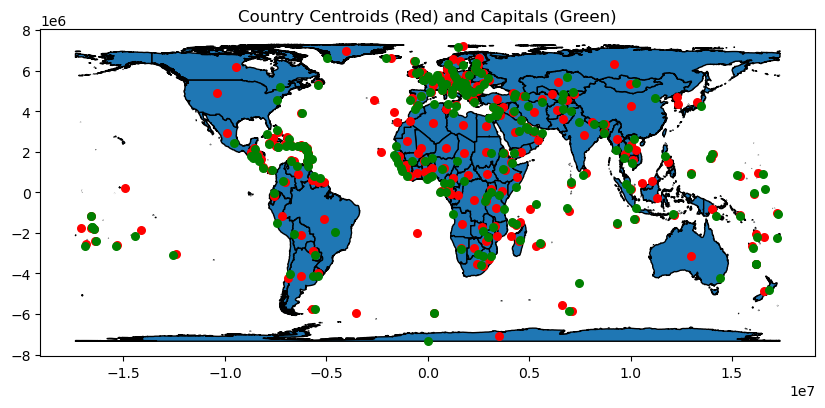

In [121]:
# Plot the boundaries and centroids
ax = countries_w_caps["geometry"].plot(figsize=(10, 6), edgecolor="black")
countries_w_caps["centroid"].plot(ax=ax, color="red", markersize=30)
countries_w_caps["capLoc"].plot(ax=ax, color="green", markersize=30)
plt.title("Country Centroids (Red) and Capitals (Green)")

In [123]:
countries_w_caps.head()

,FID,COUNTRY,ISO,COUNTRYAFF,AFF_ISO,Shape__Area,Shape__Length,geometry,area,Population,Capital,capPop,capLoc,centroid
0,1,Afghanistan,AF,Afghanistan,AF,9.346494e+11,6.110457e+06,"POLYGON ((5912346.780 4262179.095, 5914259.916...",6.419074e+11,34262840.0,Kabul,4601789.0,POINT (6668166.828 4125950.739),POINT (6366934.491 4067802.352)
1,2,Albania,AL,Albania,AL,5.058670e+10,1.271948e+06,"POLYGON ((1888316.306 4870659.748, 1889389.049...",2.865394e+10,2402113.0,Tirana,557422.0,POINT (1880517.602 4823013.622),POINT (1936418.331 4817221.653)
2,3,Algeria,DZ,Algeria,DZ,3.014489e+12,8.316049e+06,"POLYGON ((444160.510 4394555.028, 447267.377 4...",2.317515e+12,46700000.0,Algiers,3915811.0,POINT (292353.429 4349530.731),POINT (254474.979 3425069.282)
3,4,American Samoa,AS,United States,US,1.754581e+08,6.729120e+04,"POLYGON ((-16474443.787 -1815255.300, -1647497...",1.637721e+08,NaN,Pago Pago,3656.0,POINT (-16443191.880 -1788582.797),POINT (-16470963.469 -1806453.222)
4,5,Andorra,AD,Andorra,AD,9.349956e+08,1.171375e+05,"POLYGON ((139503.351 4957892.910, 143429.470 4...",5.071533e+08,86398.0,Andorra la Vella,22873.0,POINT (126397.027 4929296.521),POINT (152135.060 4952849.144)


In [122]:
# Assuming capLoc contains point coordinates in the format [(lon, lat), (lon, lat), ...]
# Create a GeoDataFrame for capital city points
# capitals_gdf = gpd.GeoDataFrame(
#     countries_w_caps[['capLoc']],  # Keep any relevant columns from the countries GeoDataFrame
#     geometry=gpd.points_from_xy(
#         x=[coords[0] for coords in countries_w_caps['capLoc']],  # Extract longitude
#         y=[coords[1] for coords in countries_w_caps['capLoc']]   # Extract latitude
#     ),
#     crs=countries_w_caps.crs  # Use the same CRS as countries_w_caps
# )

# Now, let's add capital city points to the existing map
# Create the base map with boundaries
boundary_map = countries_w_caps.explore(style_kwds={"fillOpacity": 0.0, "color": "blue"})

# Add centroids as a separate layer
countries_w_caps.set_geometry("centroid").explore(
    m=boundary_map, marker_type='circle', marker_kwds={"radius": 5, "color": "red"}
)

countries_w_caps.set_geometry("capLoc").explore(
    m=boundary_map, marker_type='circle', marker_kwds={"radius": 5, "color": "green"}
)

# Display the map
boundary_map


In [124]:
# Assuming countries_w_caps has the centroids and capital locations
# Create a DataFrame to hold the results
closer_centroids = []

# Loop through each country
for idx, country in countries_w_caps.iterrows():
    country_centroid = country['centroid']
    country_cap_loc = country['capLoc']
    
    # Calculate the distance to the centroid of each country
    distances = countries_w_caps['capLoc'].distance(country_centroid)

    # Find the closest capital city (not the country's own capital)
    closest_index = distances[distances.index != idx].idxmin()
    closest_distance = distances[closest_index]

    # Compare distances
    if closest_distance < country_cap_loc.distance(country_centroid):
        closer_centroids.append({
            'country': country['COUNTRY'],
            'closest_country': countries_w_caps.loc[closest_index]['COUNTRY'],
            'distance_to_closest': closest_distance,
            'own_distance': country_cap_loc.distance(country_centroid)
        })

# Create a DataFrame with the results
closer_centroids_df = gpd.GeoDataFrame(closer_centroids)

# Display the results
print(closer_centroids_df)


AttributeError: 'NoneType' object has no attribute 'distance'

## Summary

This lecture provided an introduction to working with geospatial data using GeoPandas. We covered basic concepts such as reading/writing geospatial data, performing spatial operations (e.g., buffering, intersections), and visualizing geospatial data using maps. GeoPandas, built on Pandas and Shapely, enables efficient and intuitive geospatial analysis in Python.